In [1]:
import anndata as ad             # For reading/writing AnnData files
import matplotlib.pyplot as plt  # For plotting
import metacells as mc           # The Metacells package
import numpy as np               # For array/matrix operations
import pandas as pd              # For data frames
import os                        # For filesystem operations
import seaborn as sb             # For plotting
import scipy.sparse as sp        # For sparse matrices
import shutil                    # for filesystem operations
from math import hypot           # For plotting
from typing import * 

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [76]:
cl_tbl = cells.obs[['Subclass', 'cell_type', 'cell_type_ontology_term_id', 'tissue', 'tissue_ontology_term_id']].reset_index(drop=True).drop_duplicates(subset=['Subclass'])

In [79]:
cl_tbl.Subclass.cat.categories

Index(['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT',
       'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6',
       'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst',
       'Sst Chodl', 'VLMC', 'Vip'],
      dtype='object')

In [2]:
import scanpy as sc

In [3]:
adata = ad.read_h5ad("Great_Ape_MTG_public/gorilla_cellxgene_obs.h5ad")

In [4]:
adata

AnnData object with n_obs × n_vars = 139945 × 55218
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', '...1', 'Cluster', 'Neighborhood', 'Subclass', 'CrossSpeciesCluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_ontology_term_id', 'is_primary_data', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_id'
    var: 'name'

In [5]:
adata.obs['tissue']

SM-GBMFV_S073_E1-50                      middle temporal gyrus
SM-GBMFV_S093_E1-50                      middle temporal gyrus
SM-GE4VH_S089_E1-50                      middle temporal gyrus
SM-GE4VH_S091_E1-50                      middle temporal gyrus
SM-GE4VH_S092_E1-50                      middle temporal gyrus
                                                 ...          
TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11    middle temporal gyrus
TTTGTTGCAAGTATCC-18L8TX_200723_01_A11    middle temporal gyrus
TTTGTTGCAGGACTAG-18L8TX_200723_01_A11    middle temporal gyrus
TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11    middle temporal gyrus
TTTGTTGGTGAGATTA-18L8TX_200723_01_A11    middle temporal gyrus
Name: tissue, Length: 139945, dtype: category
Categories (1, object): ['middle temporal gyrus']

In [6]:
adata.X.max()

63074.0

In [7]:
adata.obs['assay'].value_counts()

assay
10x 3' v3       135568
Smart-seq v4      4377
Name: count, dtype: int64

In [8]:
adata_10x = adata[adata.obs.assay == '10x 3\' v3']

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


In [9]:
adata_10x.obs

,orig.ident,nCount_RNA,nFeature_RNA,...1,Cluster,Neighborhood,Subclass,CrossSpeciesCluster,assay_ontology_term_id,cell_type_ontology_term_id,...,donor_id,cell_type,assay,disease,organism,sex,tissue,self_reported_ethnicity,development_stage,cell_id
AAAGTCCAGAGATTCA-1L8TX_190822_01_E11,SeuratProject,3425.0,1936.0,AAAGTCCAGAGATTCA-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,G19.32.002,astrocyte of the cerebral cortex,10x 3' v3,normal,Gorilla gorilla,female,middle temporal gyrus,na,prime adult stage,AAAGTCCAGAGATTCA-1L8TX_190822_01_E11
AAATGGATCCCTGTTG-1L8TX_190822_01_E11,SeuratProject,3831.0,1963.0,AAATGGATCCCTGTTG-1L8TX_190822_01_E11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,G19.32.002,oligodendrocyte,10x 3' v3,normal,Gorilla gorilla,female,middle temporal gyrus,na,prime adult stage,AAATGGATCCCTGTTG-1L8TX_190822_01_E11
AACAAGATCCGGCAAC-1L8TX_190822_01_E11,SeuratProject,4315.0,2225.0,AACAAGATCCGGCAAC-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,G19.32.002,astrocyte of the cerebral cortex,10x 3' v3,normal,Gorilla gorilla,female,middle temporal gyrus,na,prime adult stage,AACAAGATCCGGCAAC-1L8TX_190822_01_E11
AACAAGATCGTTGTGA-1L8TX_190822_01_E11,SeuratProject,2894.0,1633.0,AACAAGATCGTTGTGA-1L8TX_190822_01_E11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,G19.32.002,oligodendrocyte,10x 3' v3,normal,Gorilla gorilla,female,middle temporal gyrus,na,prime adult stage,AACAAGATCGTTGTGA-1L8TX_190822_01_E11
AACAGGGGTAACTGCT-1L8TX_190822_01_E11,SeuratProject,11556.0,3921.0,AACAGGGGTAACTGCT-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,G19.32.002,astrocyte of the cerebral cortex,10x 3' v3,normal,Gorilla gorilla,female,middle temporal gyrus,na,prime adult stage,AACAGGGGTAACTGCT-1L8TX_190822_01_E11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11,SeuratProject,22645.0,6761.0,TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11,L4 IT_5,it_types,L4 IT,L2/3 IT_2,EFO:0009922,CL:4023040,...,G20.32.001,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Gorilla gorilla,male,middle temporal gyrus,na,prime adult stage,TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11
TTTGTTGCAAGTATCC-18L8TX_200723_01_A11,SeuratProject,41021.0,8293.0,TTTGTTGCAAGTATCC-18L8TX_200723_01_A11,L5 IT_2,it_types,L5 IT,L5 IT_2,EFO:0009922,CL:4023040,...,G20.32.001,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Gorilla gorilla,male,middle temporal gyrus,na,prime adult stage,TTTGTTGCAAGTATCC-18L8TX_200723_01_A11
TTTGTTGCAGGACTAG-18L8TX_200723_01_A11,SeuratProject,22196.0,6648.0,TTTGTTGCAGGACTAG-18L8TX_200723_01_A11,L2/3 IT_1,it_types,L2/3 IT,L2/3 IT_3,EFO:0009922,CL:4023040,...,G20.32.001,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Gorilla gorilla,male,middle temporal gyrus,na,prime adult stage,TTTGTTGCAGGACTAG-18L8TX_200723_01_A11
TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11,SeuratProject,30491.0,7881.0,TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11,L2/3 IT_1,it_types,L2/3 IT,L2/3 IT_3,EFO:0009922,CL:4023040,...,G20.32.001,L2/3-6 intratelencephalic projecting glutamate...,10x 3' v3,normal,Gorilla gorilla,male,middle temporal gyrus,na,prime adult stage,TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11


In [10]:
full = adata_10x
mc.ut.top_level(full)
mc.ut.set_name(full, "gorilla_mtg_full")
print(f"Full: {full.n_obs} cells, {full.n_vars} genes")

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/contextlib.py:144: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  next(self.gen)


Full: 135568 cells, 55218 genes


In [11]:
PROPERLY_SAMPLED_MIN_CELL_TOTAL = 200
PROPERLY_SAMPLED_MAX_CELL_TOTAL = 200000

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


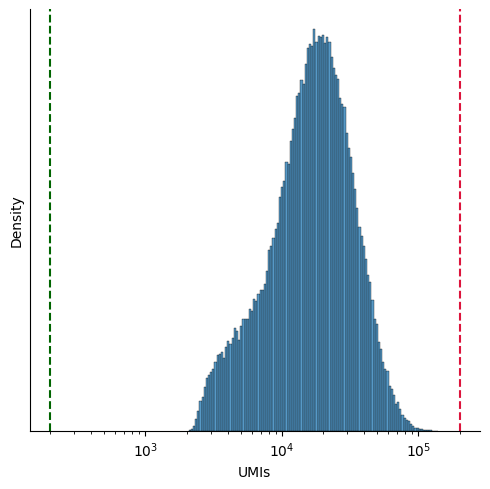

In [12]:
total_umis_per_cell = mc.ut.get_o_numpy(full, "__x__", sum=True)
plot = sb.displot(total_umis_per_cell, log_scale=(10, None))
plot.set(xlabel="UMIs", ylabel="Density", yticks=[])

plot.refline(x=PROPERLY_SAMPLED_MIN_CELL_TOTAL, color="darkgreen")
plot.refline(x=PROPERLY_SAMPLED_MAX_CELL_TOTAL, color="crimson")

In [13]:
## since the data is filtered by cellxgene and the author I do not exclude any cell types here

In [14]:
too_small_cells_count = np.sum(total_umis_per_cell < PROPERLY_SAMPLED_MIN_CELL_TOTAL)
too_large_cells_count = np.sum(total_umis_per_cell > PROPERLY_SAMPLED_MAX_CELL_TOTAL)

total_umis_per_cell = mc.ut.get_o_numpy(full, name="__x__", sum=True)
too_small_cells_percent = 100.0 * too_small_cells_count / full.n_obs
too_large_cells_percent = 100.0 * too_large_cells_count / full.n_vars

print(
    f"Will exclude {too_small_cells_count} ({too_small_cells_percent:.2f}%%) cells"
    f" with less than {PROPERLY_SAMPLED_MIN_CELL_TOTAL} UMIs"
)
print(
    f"Will exclude {too_large_cells_count} ({too_large_cells_percent:.2f}%%) cells"
    f" with more than {PROPERLY_SAMPLED_MAX_CELL_TOTAL} UMIs"
)

Will exclude 0 (0.00%%) cells with less than 200 UMIs
Will exclude 0 (0.00%%) cells with more than 200000 UMIs


In [15]:
EXCLUDED_GENE_NAMES = ["XIST", "MALAT1"]  # Sex-specific genes.
EXCLUDED_GENE_PATTERNS = ["MT-.*"]  

In [16]:
full.var

,name
5S-rRNA,5S-rRNA
5-8S-rRNA,5-8S-rRNA
7SK,7SK
A1BG,A1BG
A1BG-AS1,A1BG-AS1
...,...
snoZ278,snoZ278
snoZ40,snoZ40
snoZ6,snoZ6
snosnR66,snosnR66


In [17]:
full.var

,name
5S-rRNA,5S-rRNA
5-8S-rRNA,5-8S-rRNA
7SK,7SK
A1BG,A1BG
A1BG-AS1,A1BG-AS1
...,...
snoZ278,snoZ278
snoZ40,snoZ40
snoZ6,snoZ6
snosnR66,snosnR66


In [18]:
mc.pl.exclude_genes(
    full,
    excluded_gene_names=EXCLUDED_GENE_NAMES, 
    excluded_gene_patterns=EXCLUDED_GENE_PATTERNS,
    properly_sampled_min_gene_total=1, ##get genes with at least one count,however still removed quite a bit of genes, the default is one and Yuyao checked in raw data
    random_seed=123456,
)

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set gorilla_mtg_full.var[bursty_lonely_gene]: 0 true (0%) out of 55218 bools
set gorilla_mtg_full.var[properly_sampled_gene]: 41050 true (74.34%) out of 55218 bools
set gorilla_mtg_full.var[excluded_gene]: 14170 true (25.66%) out of 55218 bools


In [19]:
full.var

,name,bursty_lonely_gene,properly_sampled_gene,excluded_gene
5S-rRNA,5S-rRNA,False,True,False
5-8S-rRNA,5-8S-rRNA,False,False,True
7SK,7SK,False,True,False
A1BG,A1BG,False,True,False
A1BG-AS1,A1BG-AS1,False,True,False
...,...,...,...,...
snoZ278,snoZ278,False,False,True
snoZ40,snoZ40,False,False,True
snoZ6,snoZ6,False,False,True
snosnR66,snosnR66,False,False,True


In [20]:
mc.tl.compute_excluded_gene_umis(full)

set gorilla_mtg_full.obs[excluded_umis]: 135568 float32s


In [21]:
PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION = 0.30


/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


Will exclude 0 (0.00%) cells with more than 30.00% excluded gene UMIs


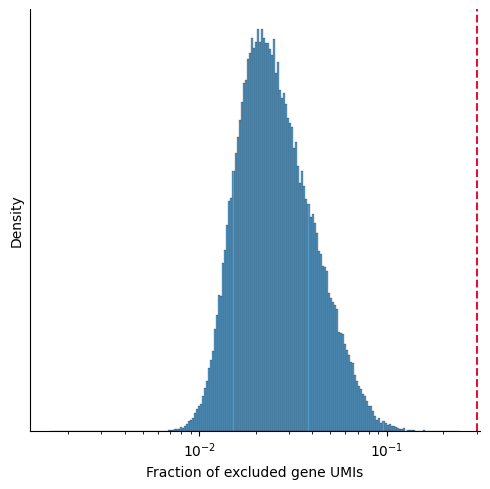

In [22]:
excluded_umis_fraction_regularization = 1e-3  # Avoid 0 values in log scale plot.
excluded_umis_per_cell = mc.ut.get_o_numpy(full, "excluded_umis")
excluded_umis_fraction_per_cell = excluded_umis_per_cell / total_umis_per_cell

excluded_umis_fraction_per_cell += excluded_umis_fraction_regularization
plot = sb.displot(excluded_umis_fraction_per_cell, log_scale=(10, None))
excluded_umis_fraction_per_cell -= excluded_umis_fraction_regularization

plot.set(xlabel="Fraction of excluded gene UMIs", ylabel="Density", yticks=[])
plot.refline(x=PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION, color="crimson")

too_excluded_cells_count = np.sum(
    excluded_umis_fraction_per_cell > PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION
)
too_excluded_cells_fraction = too_excluded_cells_count / len(total_umis_per_cell)

print(
    f"Will exclude {too_excluded_cells_count} ({100 * too_excluded_cells_fraction:.2f}%) cells"
    f" with more than {100 * PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION:.2f}% excluded gene UMIs"
)

In [23]:
## again do not exclude any cells

In [24]:
mc.pl.exclude_cells(
    full,
    properly_sampled_min_cell_total=PROPERLY_SAMPLED_MIN_CELL_TOTAL,
    properly_sampled_max_cell_total=PROPERLY_SAMPLED_MAX_CELL_TOTAL,
    properly_sampled_max_excluded_genes_fraction=PROPERLY_SAMPLED_MAX_EXCLUDED_GENES_FRACTION,
)

set gorilla_mtg_full.obs[properly_sampled_cell]: 135568 true (100%) out of 135568 bools
set gorilla_mtg_full.obs[excluded_cell]: 0 true (0%) out of 135568 bools


In [25]:
full.var

,name,bursty_lonely_gene,properly_sampled_gene,excluded_gene
5S-rRNA,5S-rRNA,False,True,False
5-8S-rRNA,5-8S-rRNA,False,False,True
7SK,7SK,False,True,False
A1BG,A1BG,False,True,False
A1BG-AS1,A1BG-AS1,False,True,False
...,...,...,...,...
snoZ278,snoZ278,False,False,True
snoZ40,snoZ40,False,False,True
snoZ6,snoZ6,False,False,True
snosnR66,snosnR66,False,False,True


In [26]:
clean = mc.pl.extract_clean_data(full, name="gorilla_mtg_clean")
mc.ut.top_level(clean)
print(f"Clean: {clean.n_obs} cells, {clean.n_vars} genes")

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set gorilla_mtg_clean.obs[full_cell_index]: 135568 int32s
set gorilla_mtg_clean.var[full_gene_index]: 41048 int32s


Clean: 135568 cells, 41048 genes


In [27]:
full.write_h5ad("gorilla_full.h5ad")

In [28]:
clean.write_h5ad("gorilla_clean.h5ad")

In [29]:
BASE_LATERAL_GENE_NAMES = [
    "AURKA", "MCM3", "MCM4", "MCM7", "MKI67", "PCNA", "RRM2", "SMC4", "TPX2",  # Cell-cycle
    "FOS", "HSP90AB1", "TXN",                                                  # Stress
]
BASE_LATERAL_GENE_PATTERNS = ["RP[LS].*"]  # Ribosomal

In [30]:
cells = clean
clean = None  # Allow it to be gc-ed
mc.ut.set_name(cells, "gorilla_mtg_iteration1")
print(f"Iteration 1: {cells.n_obs} cells, {cells.n_vars} genes")

Iteration 1: 135568 cells, 41048 genes


In [31]:
# We'll reuse this through the iterations.
# It is just a thin wrapper for mark_lateral_genes,
# and optionally also shows the results.
def update_lateral_genes(
    *,
    names: List[str] = [],
    patterns: List[str] = [],
    op: str = "set",
    show: bool = True
) -> None:
    mc.pl.mark_lateral_genes(
        cells,
        lateral_gene_names=names,
        lateral_gene_patterns=patterns,
        op=op
    )

    if not show:
        return
    
    lateral_genes_mask = mc.ut.get_v_numpy(cells, "lateral_gene")
    lateral_gene_names = set(cells.var_names[lateral_genes_mask])
    
    print(sorted([
        name for name in lateral_gene_names
        if not name.startswith("RPL") and not name.startswith("RPS")
    ]))

    print(f"""and {len([
        name for name in lateral_gene_names if name.startswith("RPL") or name.startswith("RPS")
    ])} RP[LS].* genes""")

update_lateral_genes(names=BASE_LATERAL_GENE_NAMES, patterns=BASE_LATERAL_GENE_PATTERNS)

set gorilla_mtg_iteration1.var[lateral_gene]: 726 true (1.769%) out of 41048 bools


['AURKA', 'FOS', 'HSP90AB1', 'MCM3', 'MCM4', 'MCM7', 'MKI67', 'PCNA', 'RRM2', 'SMC4', 'TPX2', 'TXN']
and 714 RP[LS].* genes


In [32]:
mc.pl.relate_to_lateral_genes(cells, random_seed=123456)

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
set gorilla_mtg_iteration1.var[lateral_genes_module]: 30999 outliers (75.52%) and 10049 grouped (24.48%) out of 41048 int32 elements with 260 groups with mean size 38.65
set gorilla_mtg_iteration1.varp[lateral_genes_similarity]: csr_matrix 41048 X 41048 float32s (100982401 > 0, 5.993%)


In [33]:
base_lateral_genes_mask = mc.ut.get_v_numpy(cells, "lateral_gene")
base_lateral_gene_names = set(cells.var_names[base_lateral_genes_mask])

module_per_gene = mc.ut.get_v_series(cells, "lateral_genes_module")
base_lateral_gene_modules = np.unique(module_per_gene.values[base_lateral_genes_mask])
base_lateral_gene_modules = set(base_lateral_gene_modules[base_lateral_gene_modules >= 0])

genes_per_module = np.unique(module_per_gene.values, return_counts=True)[1][1:]
similarity_of_modules = mc.ut.get_vv_proper(cells, "lateral_genes_similarity")
similarity_of_modules = mc.ut.sum_groups(similarity_of_modules, module_per_gene.values, per="row")[0]
similarity_of_modules = mc.ut.to_layout(similarity_of_modules, layout="column_major")
similarity_of_modules = \
    mc.ut.sum_groups(similarity_of_modules, module_per_gene.values, per="column")[0]
similarity_of_modules /= genes_per_module[:, np.newaxis] * genes_per_module[np.newaxis, :]

module_names = [
    f"(*) {gene_module}" if gene_module in base_lateral_gene_modules else str(gene_module)
    for gene_module in range(np.max(module_per_gene.values) + 1)
]
similarity_of_modules = pd.DataFrame(similarity_of_modules, index=module_names, columns=module_names)

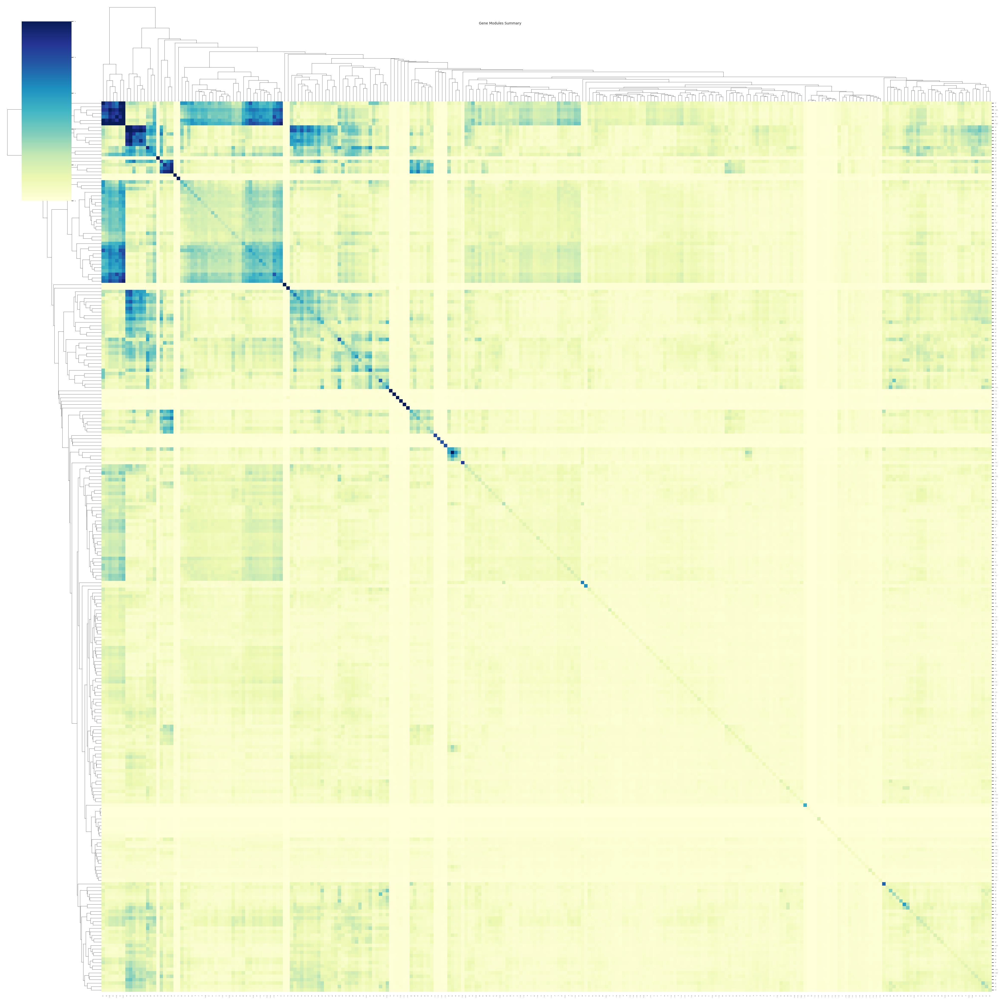

In [34]:
size = similarity_of_modules.shape[0]
if size > 50:
    sb.set(font_scale=50 / size)
size = size * 0.15 + 1
cm = sb.clustermap(
    similarity_of_modules,
    figsize=(size, size),
    vmin=0, vmax=0.5,
    xticklabels=True, yticklabels=True,
    dendrogram_ratio=0.1,
    cmap="YlGnBu",
)
cm.fig.suptitle("Gene Modules Summary", fontsize=10)

plt.show()

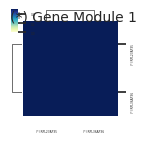

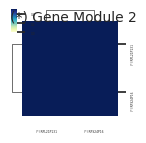

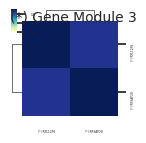

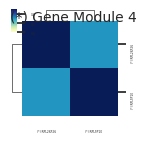

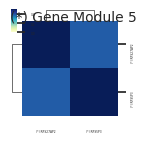

...

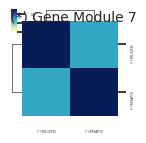

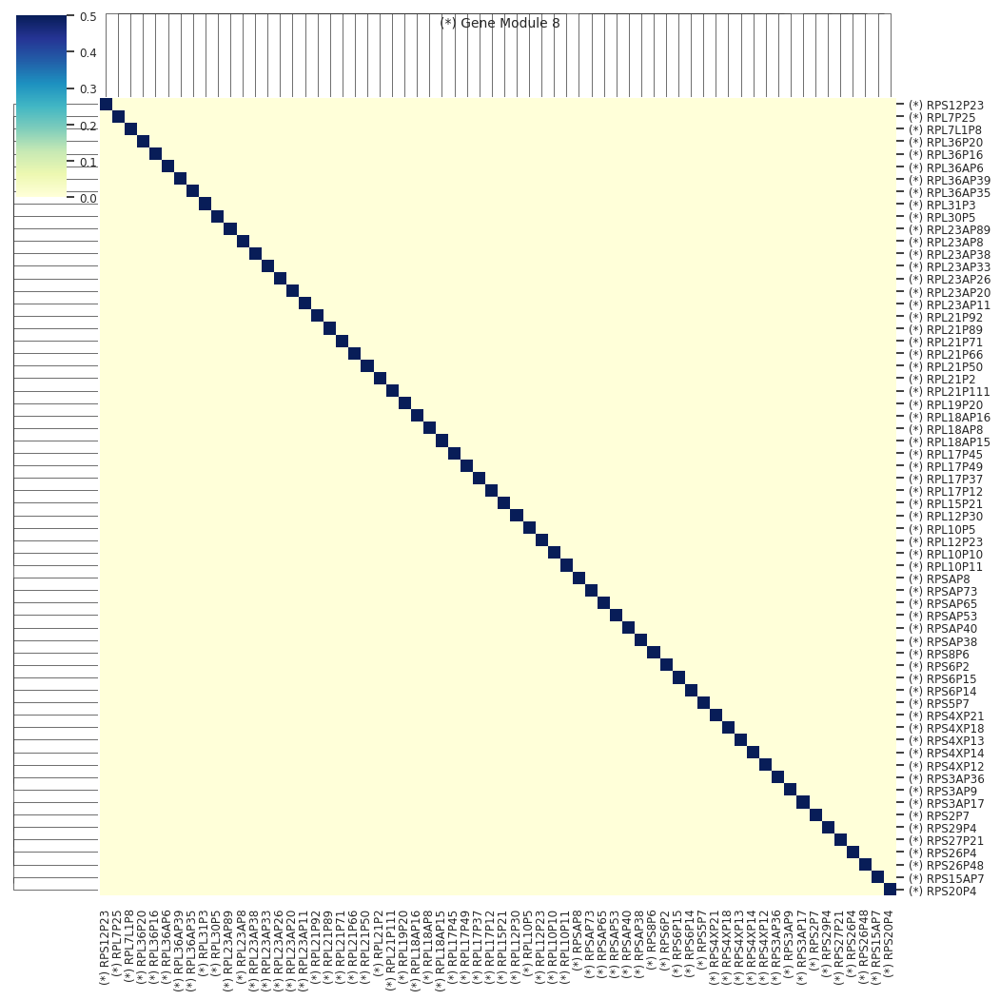

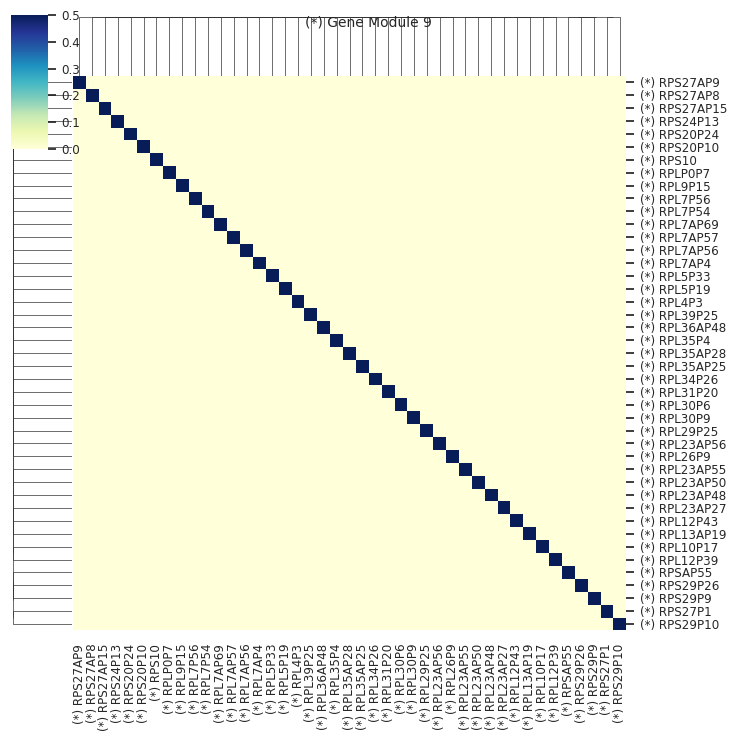

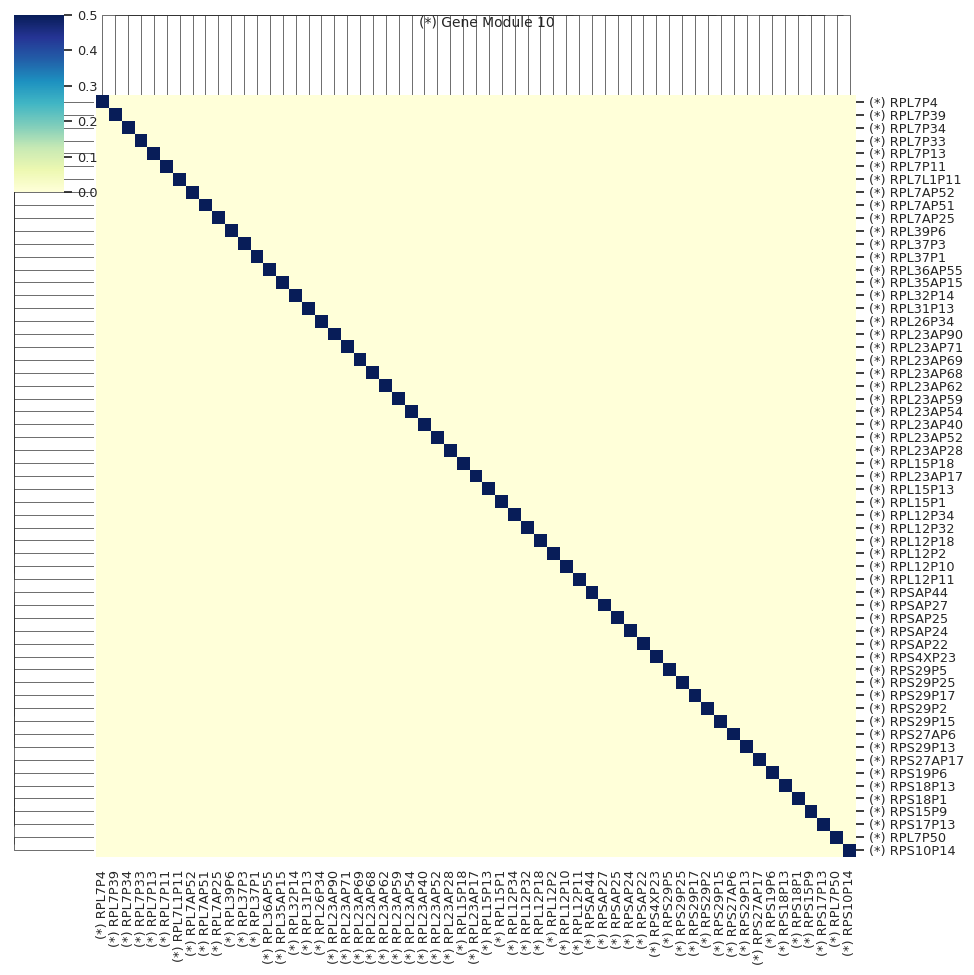

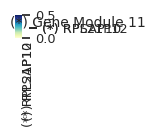

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


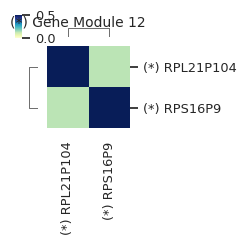

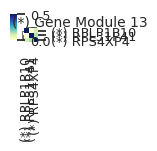

/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/seaborn/matrix.py:1113: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(**tight_params)


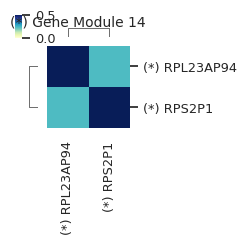

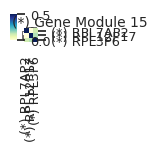

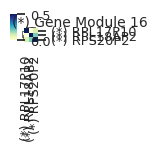

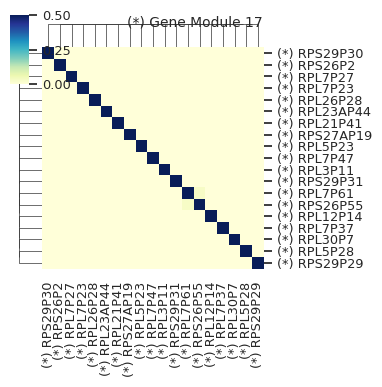

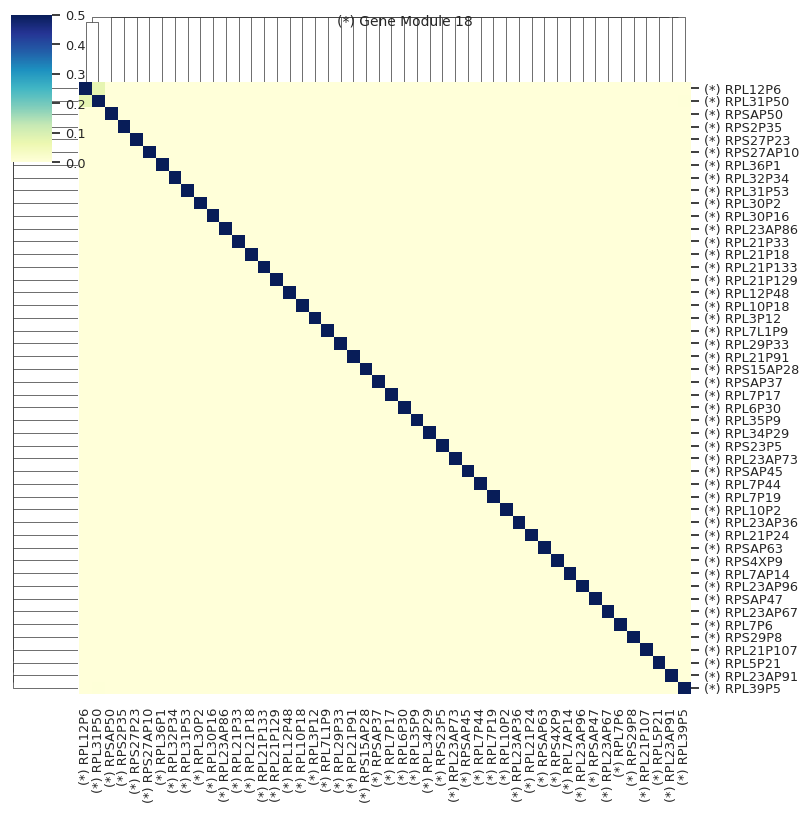

...

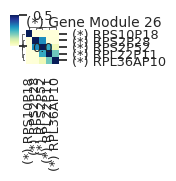

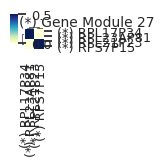

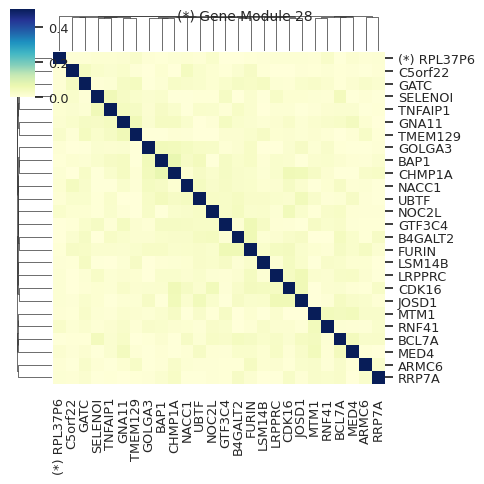

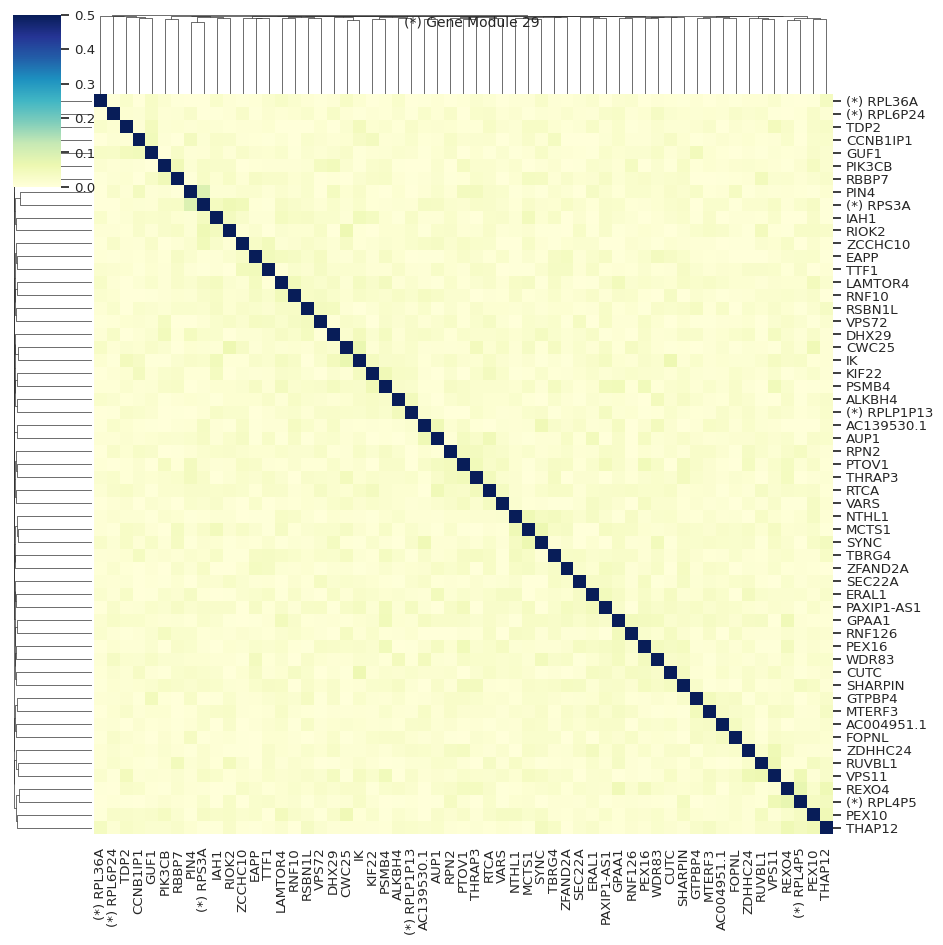

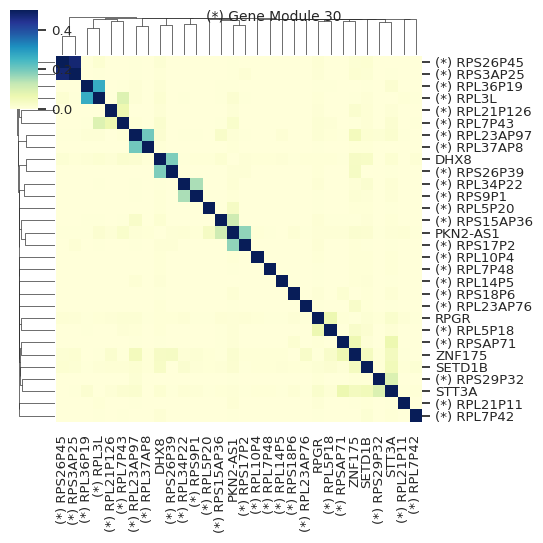

<Figure size 835x835 with 0 Axes>

<Figure size 220x220 with 0 Axes>

<Figure size 415x415 with 0 Axes>

<Figure size 295x295 with 0 Axes>

<Figure size 445x445 with 0 Axes>

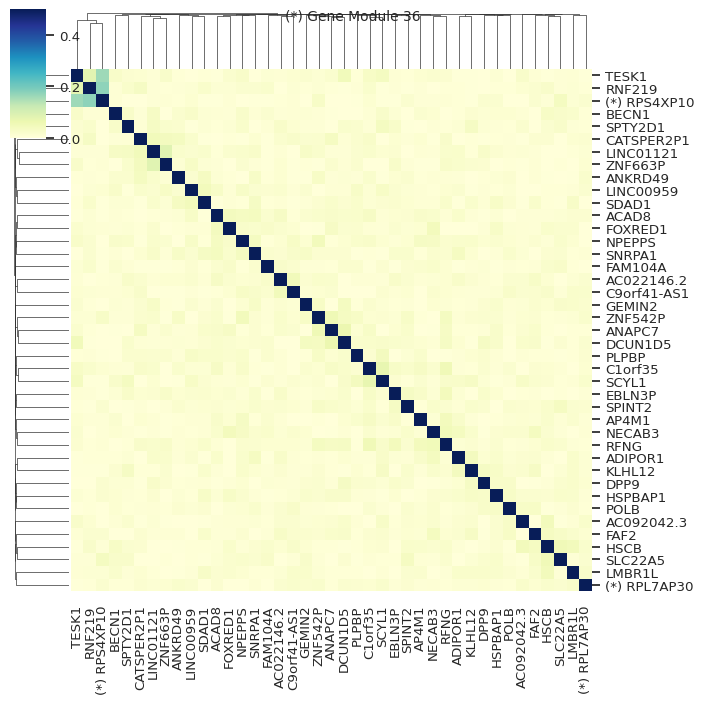

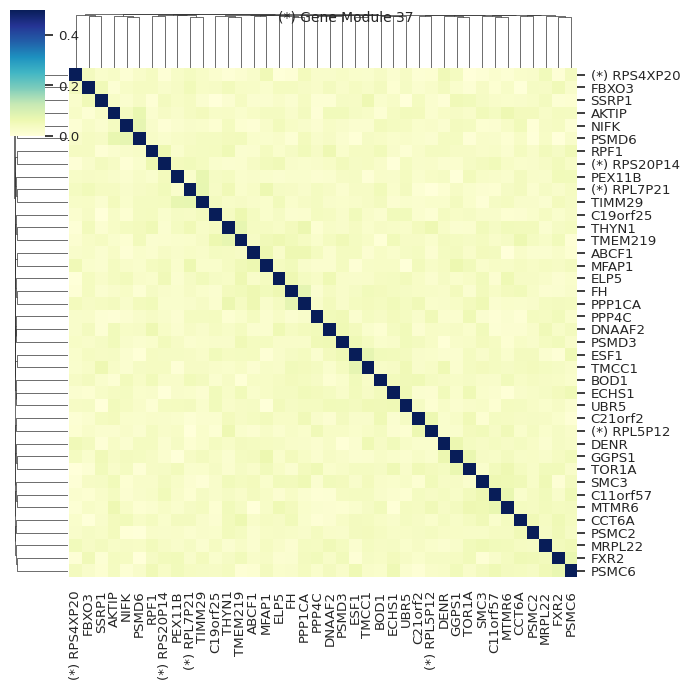

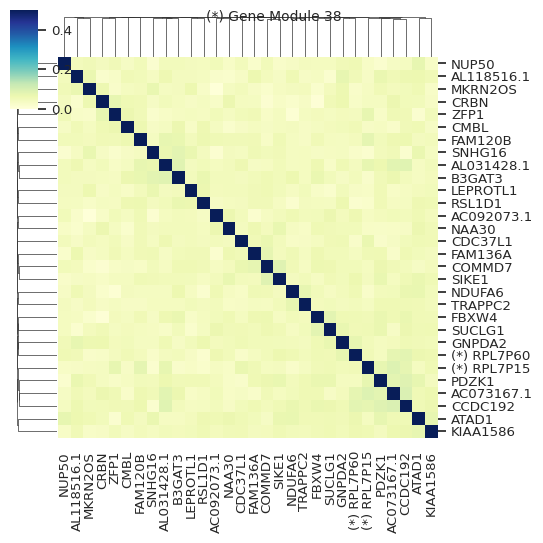

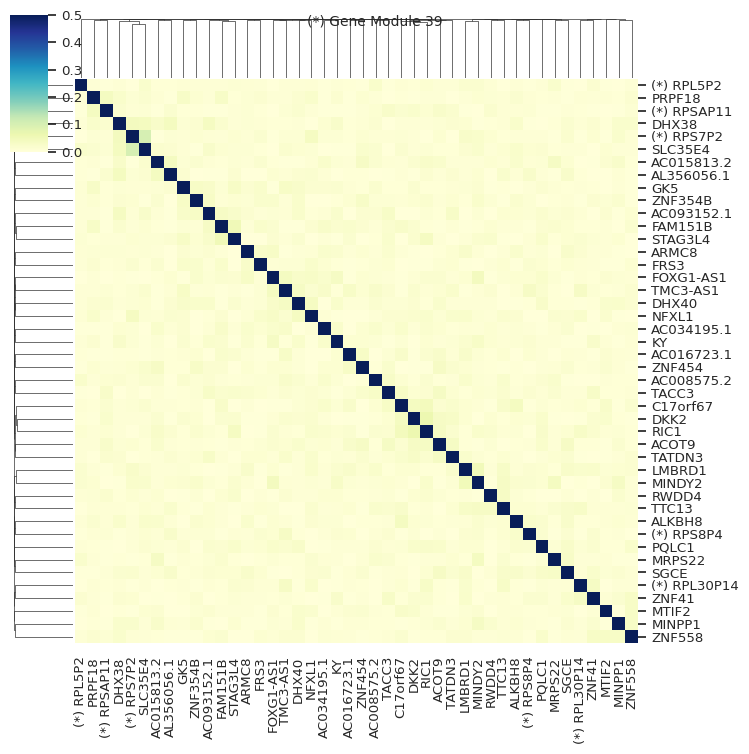

<Figure size 775x775 with 0 Axes>

<Figure size 655x655 with 0 Axes>

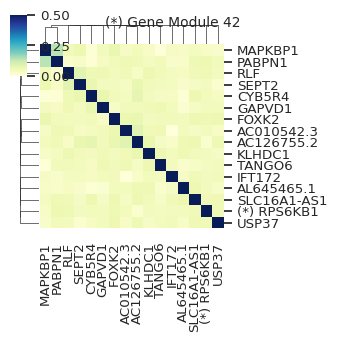

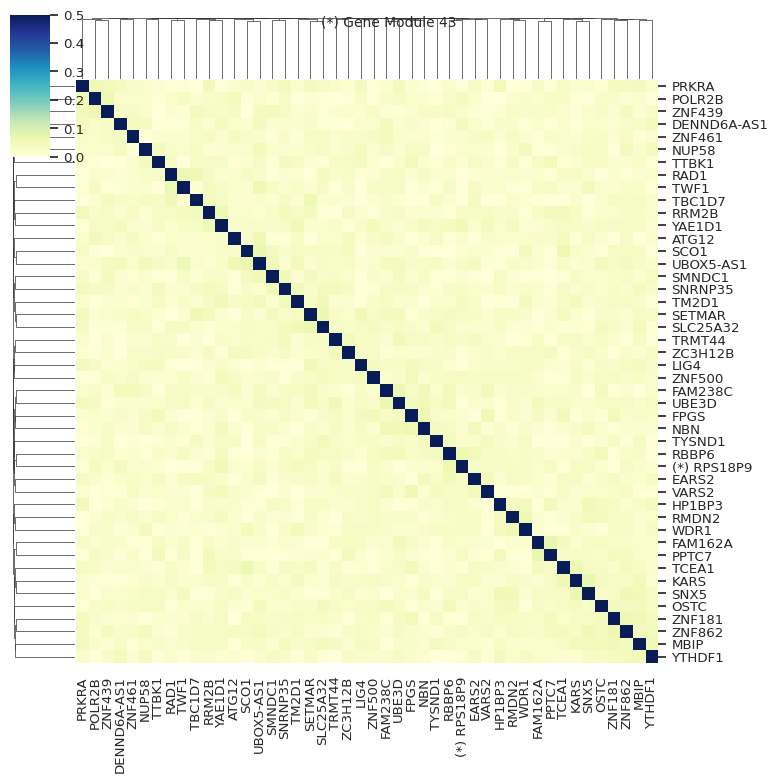

<Figure size 145x145 with 0 Axes>

<Figure size 700x700 with 0 Axes>

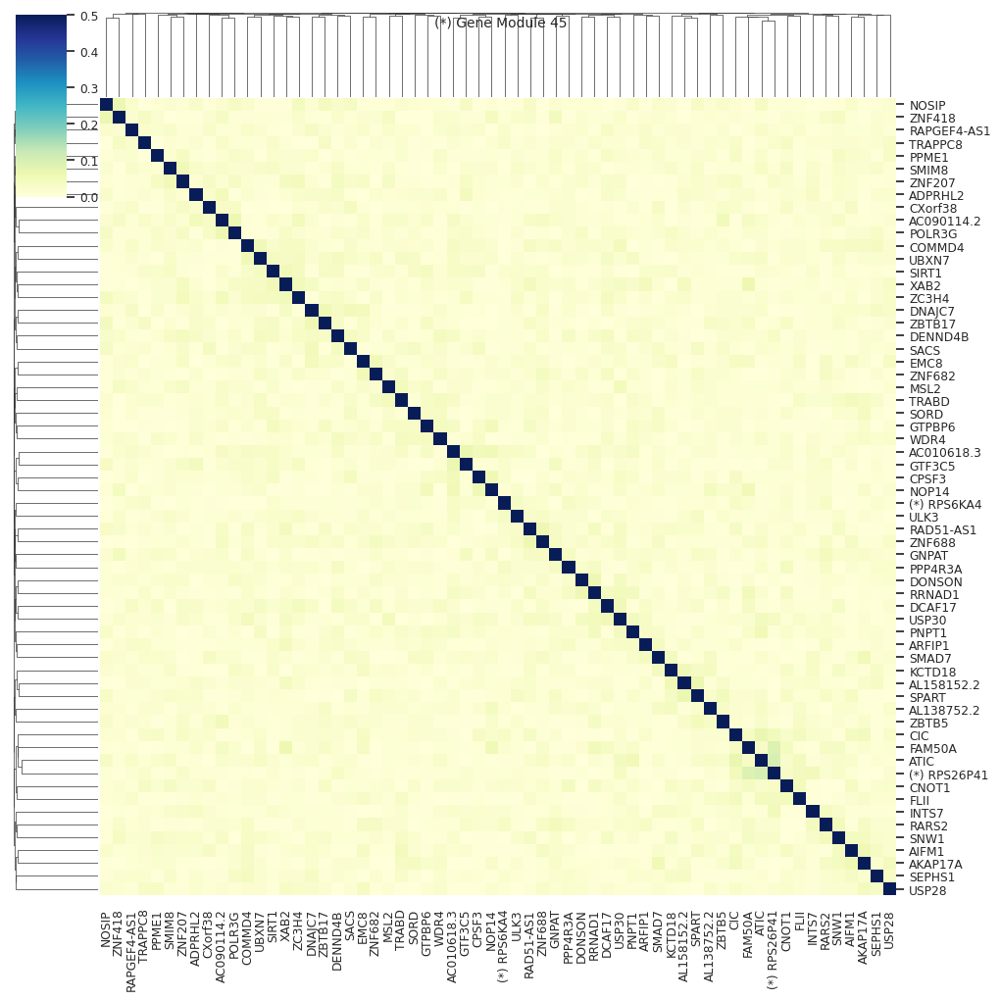

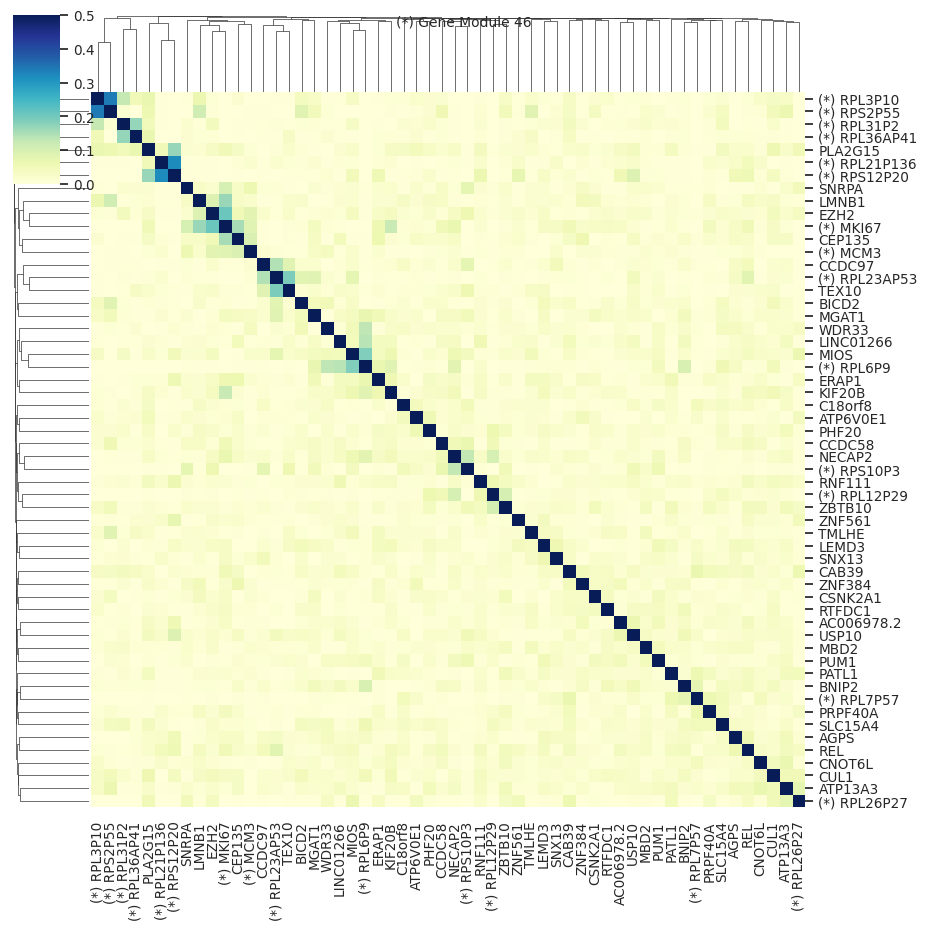

<Figure size 145x145 with 0 Axes>

<Figure size 340x340 with 0 Axes>

<Figure size 655x655 with 0 Axes>

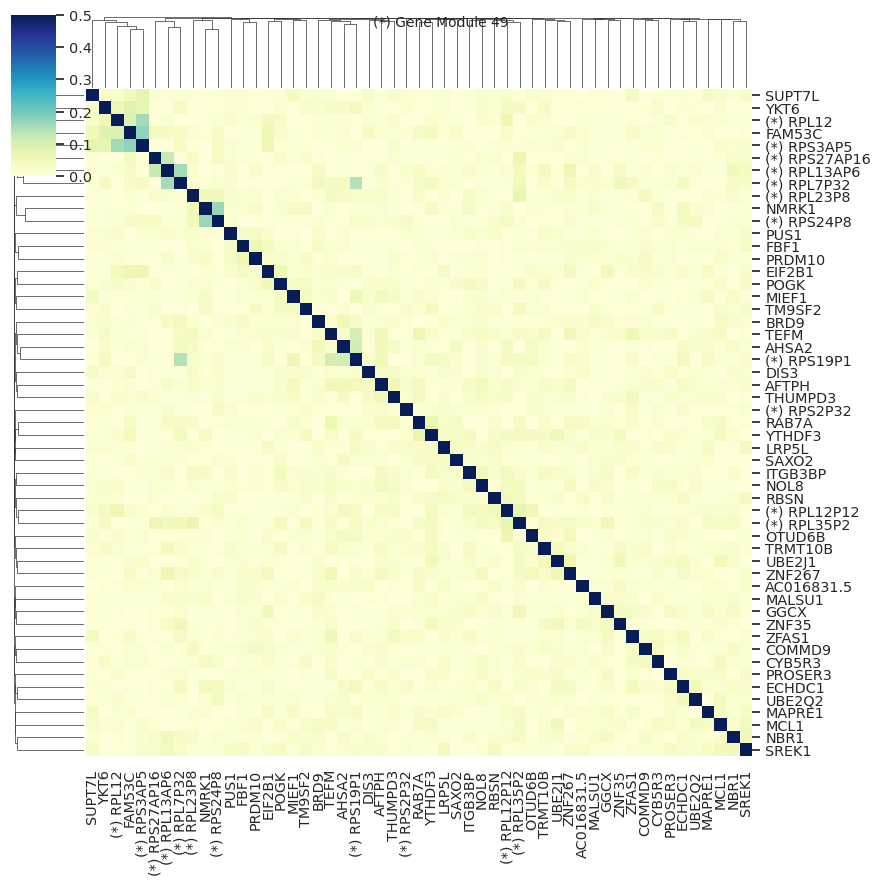

<Figure size 745x745 with 0 Axes>

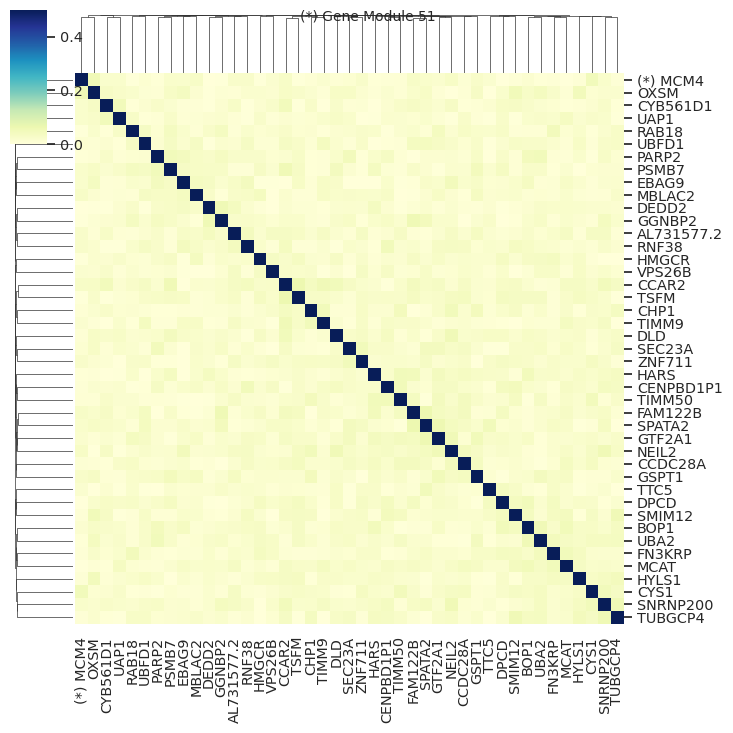

<Figure size 475x475 with 0 Axes>

<Figure size 835x835 with 0 Axes>

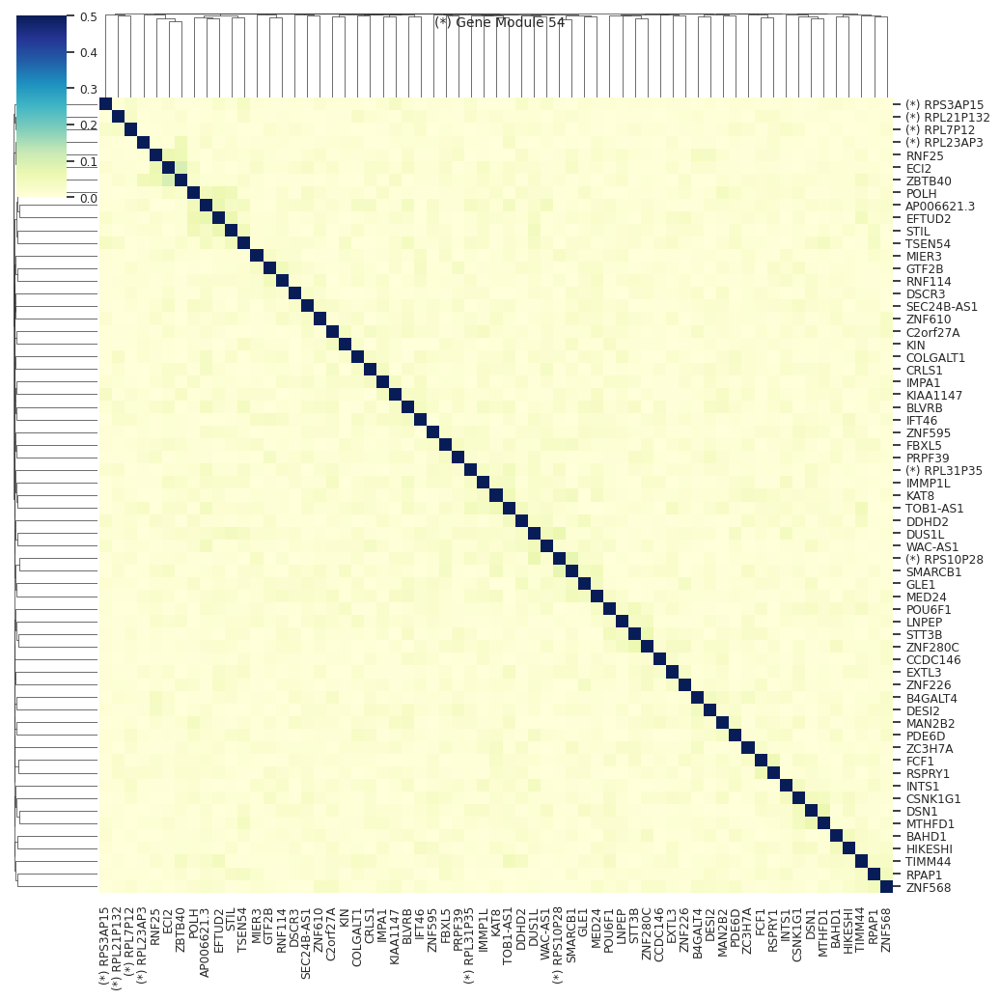

<Figure size 535x535 with 0 Axes>

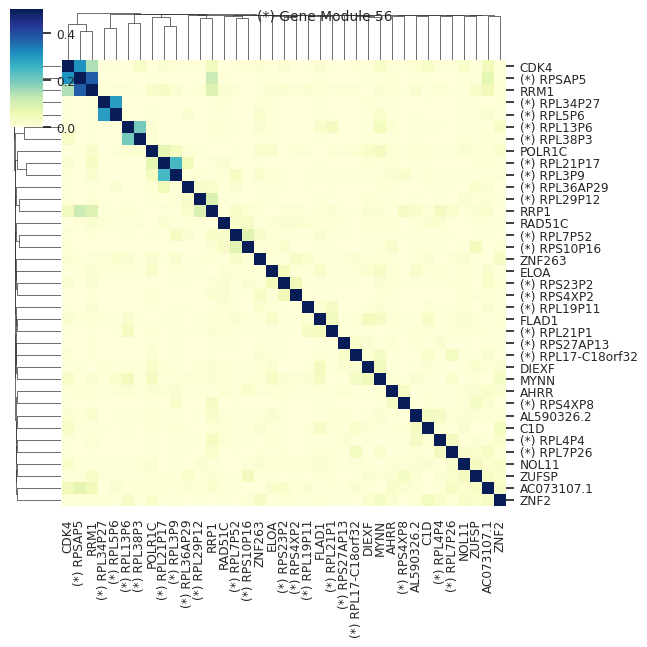

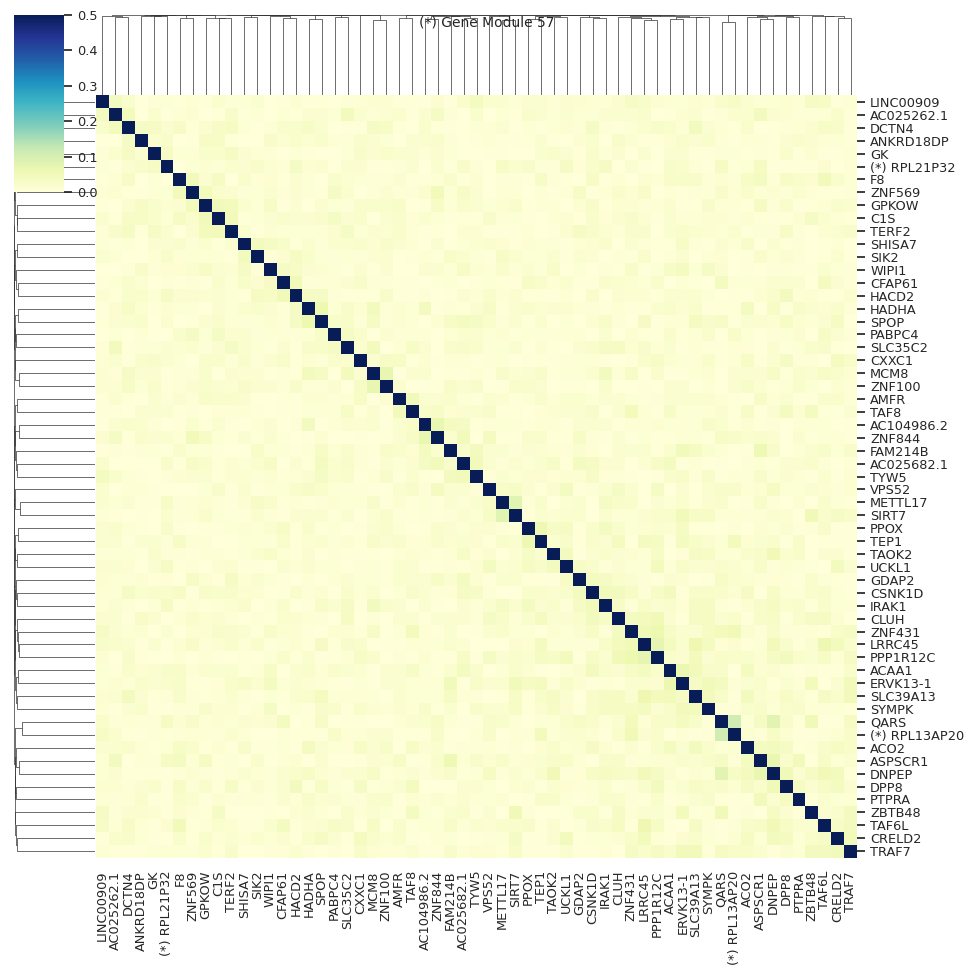

<Figure size 700x700 with 0 Axes>

<Figure size 955x955 with 0 Axes>

<Figure size 640x640 with 0 Axes>

<Figure size 730x730 with 0 Axes>

<Figure size 565x565 with 0 Axes>

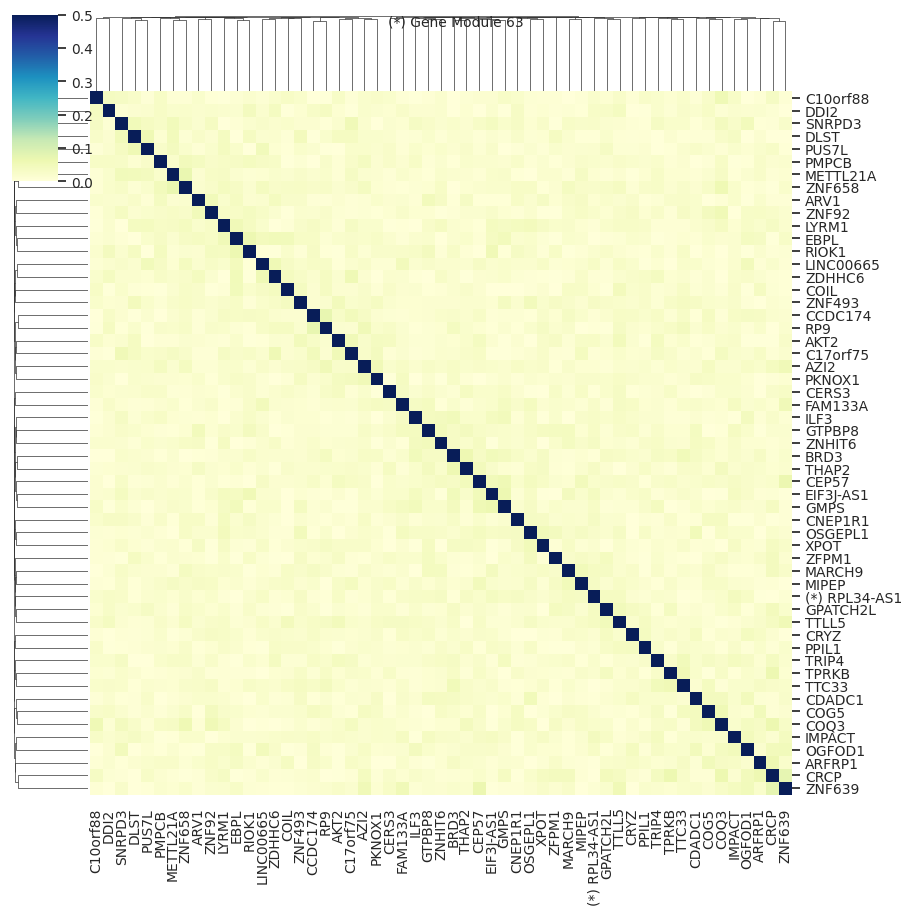

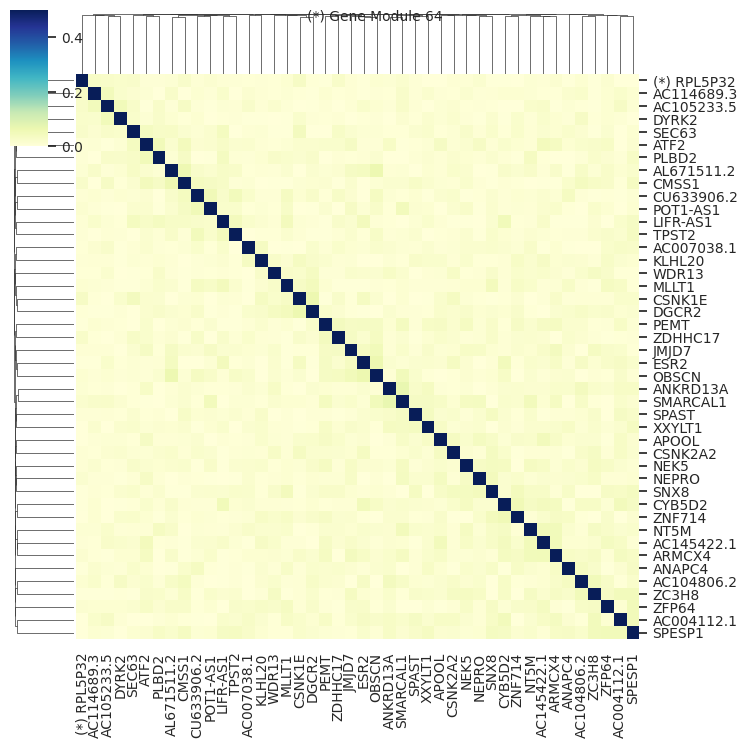

<Figure size 505x505 with 0 Axes>

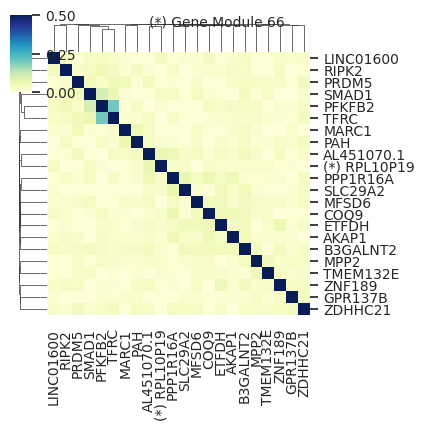

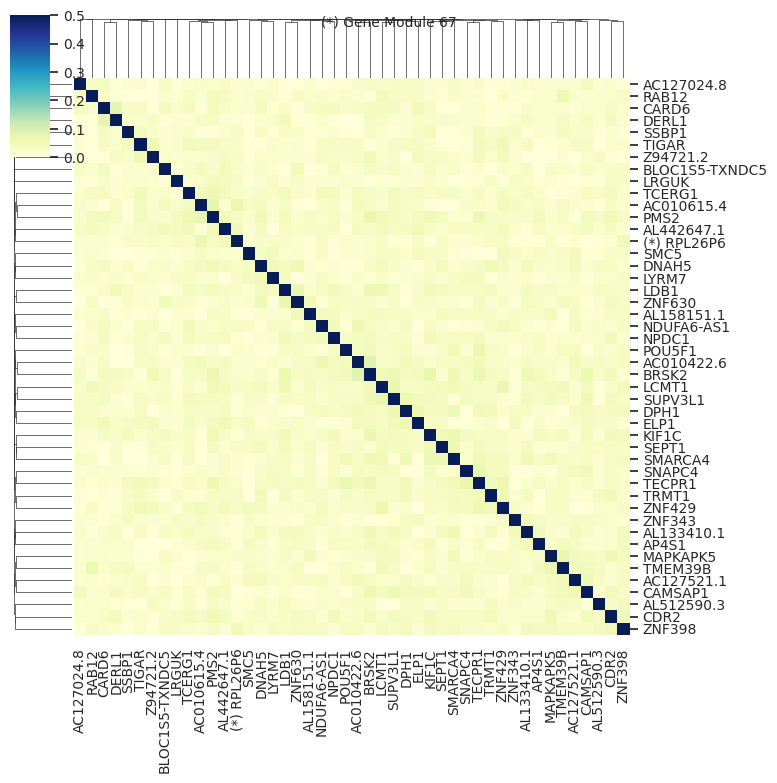

<Figure size 985x985 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 640x640 with 0 Axes>

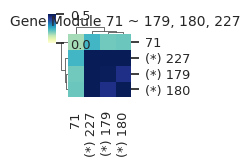

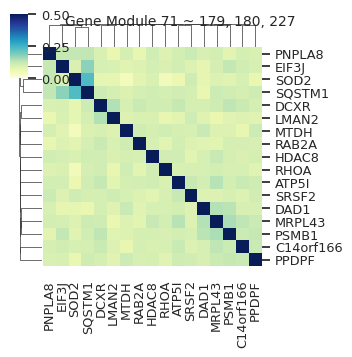

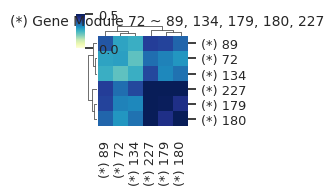

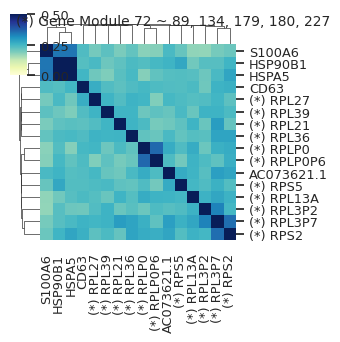

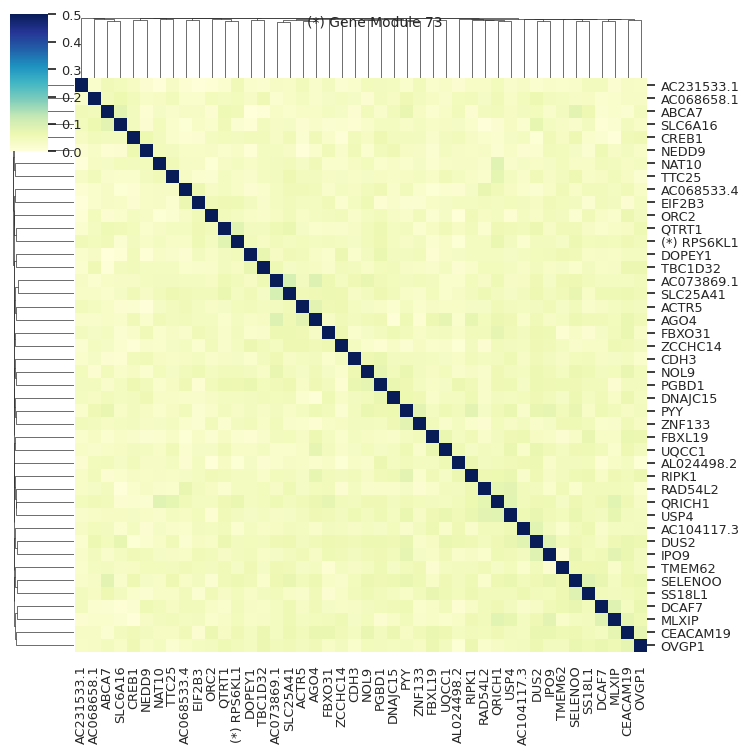

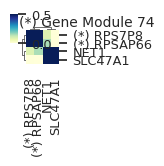

<Figure size 745x745 with 0 Axes>

<Figure size 730x730 with 0 Axes>

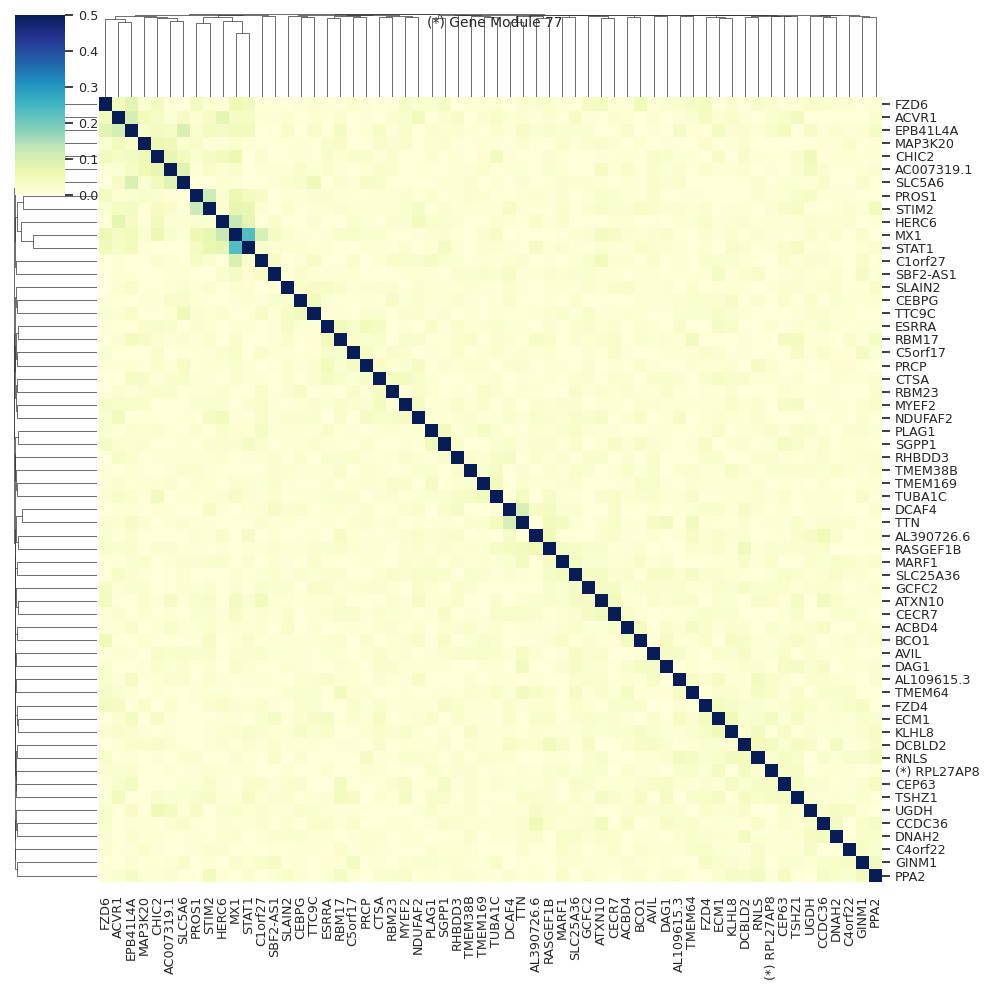

<Figure size 760x760 with 0 Axes>

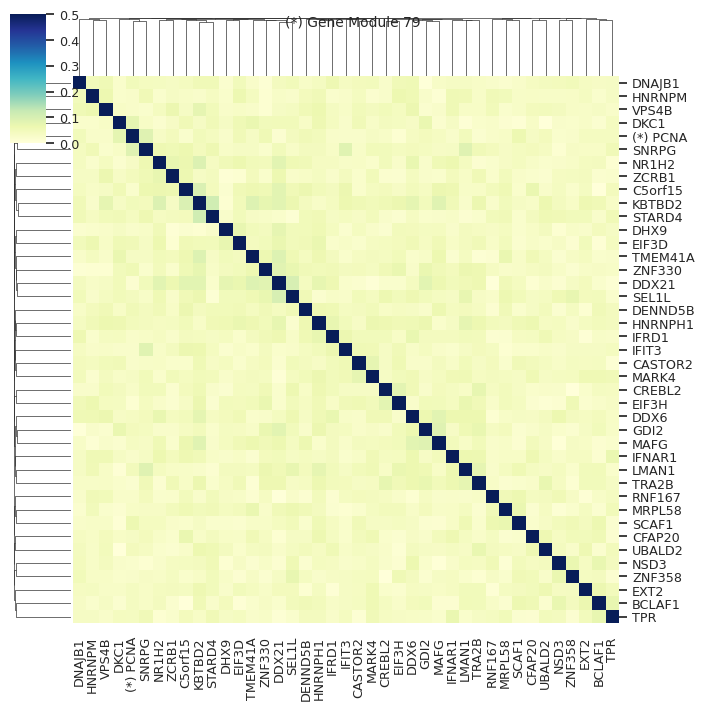

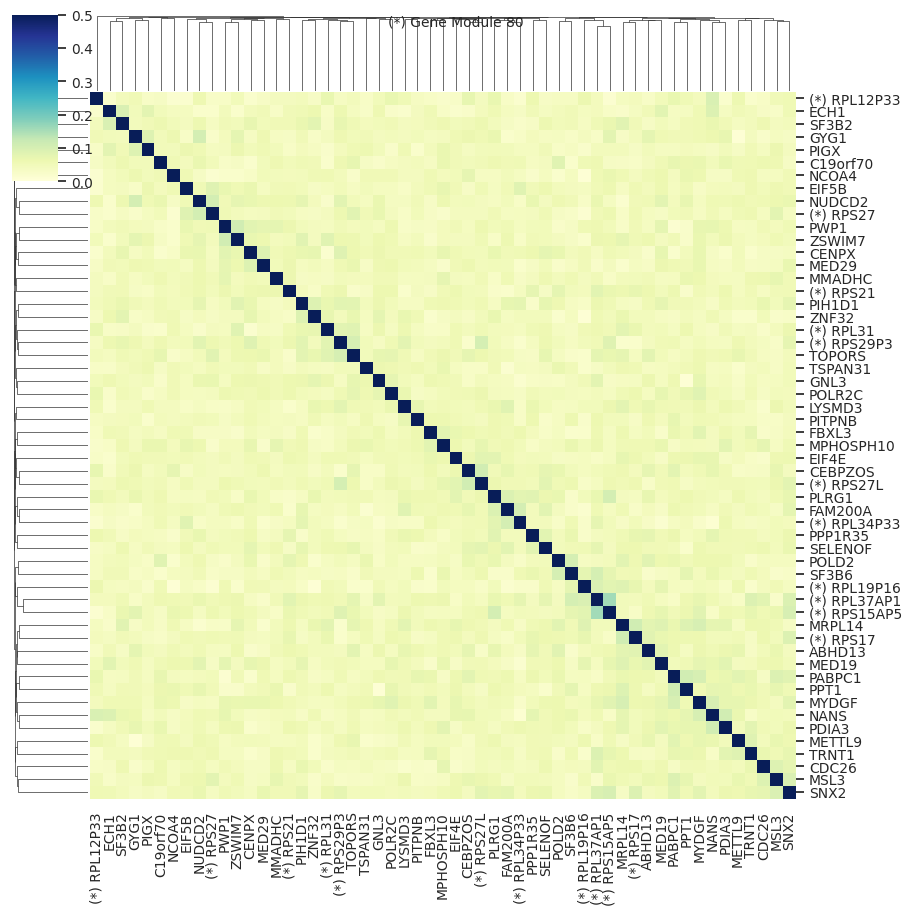

<Figure size 790x790 with 0 Axes>

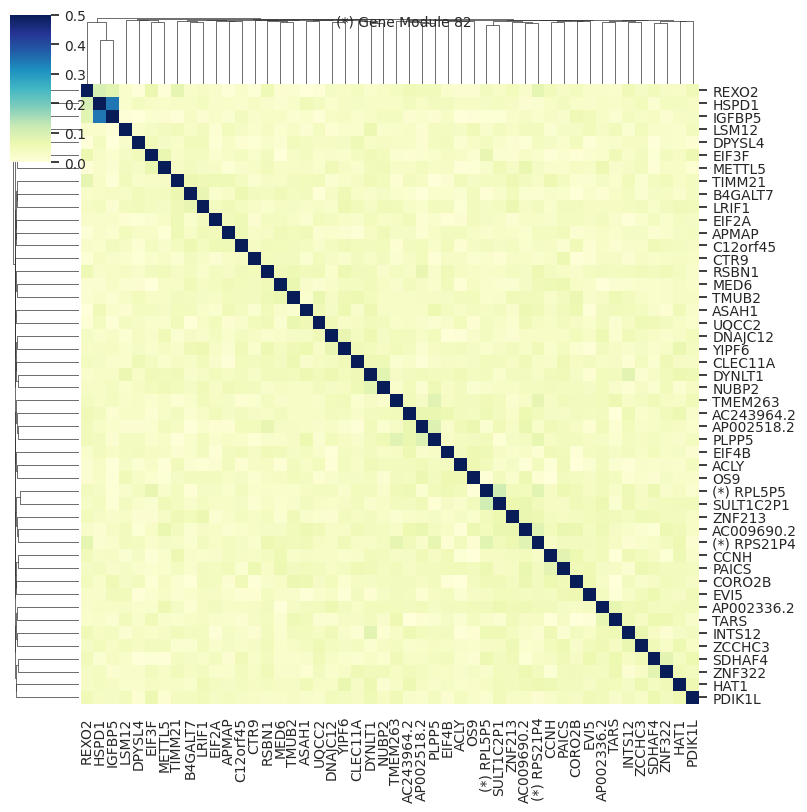

<Figure size 145x145 with 0 Axes>

<Figure size 565x565 with 0 Axes>

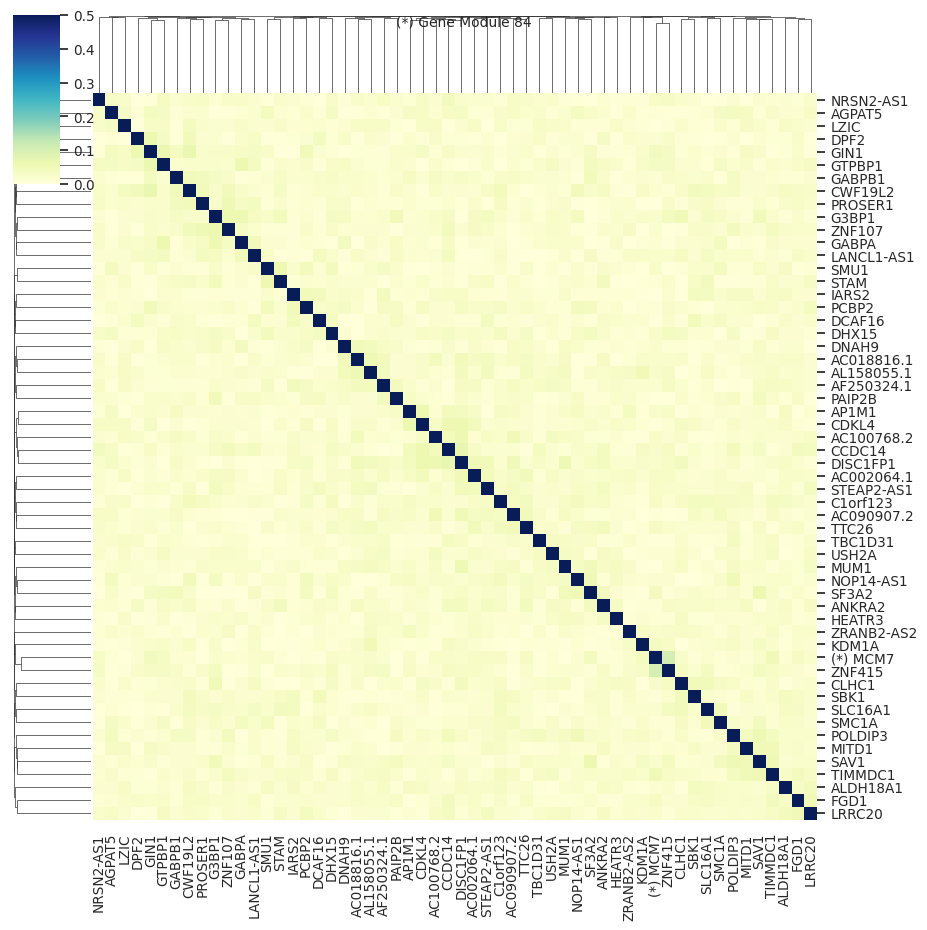

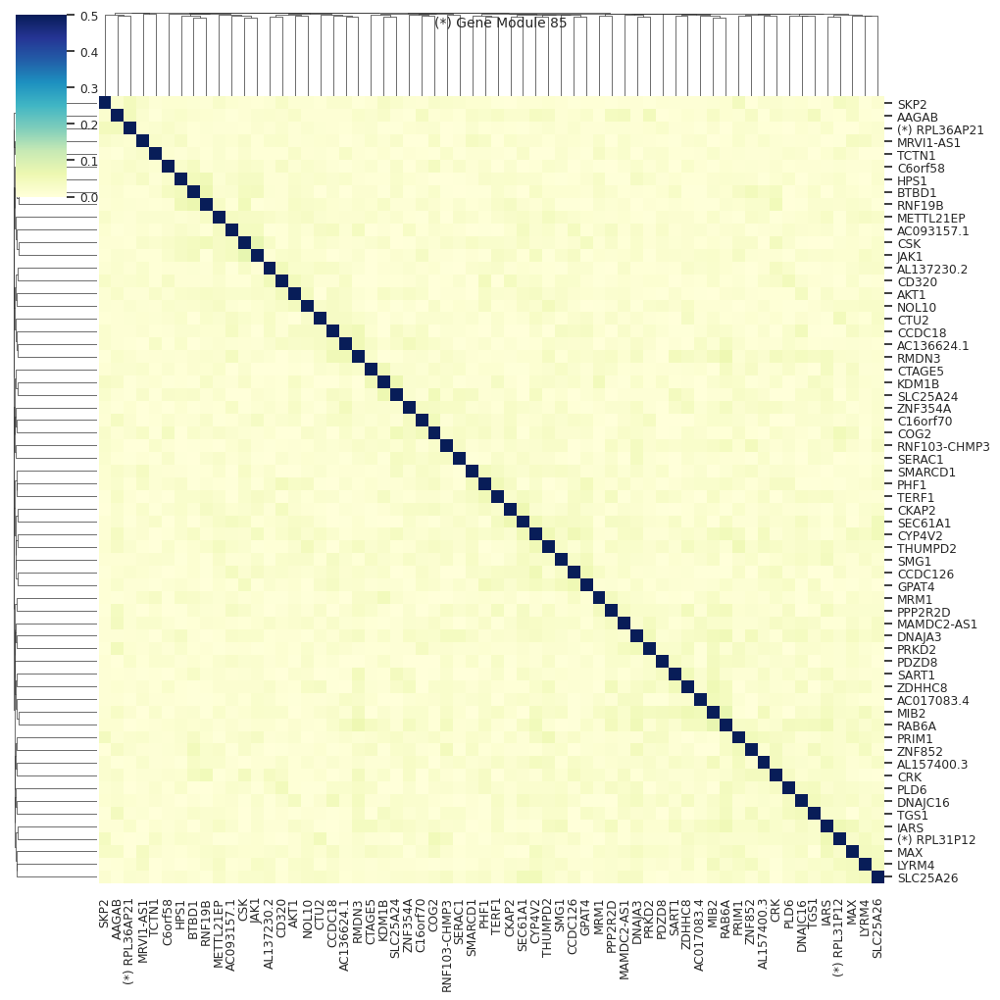

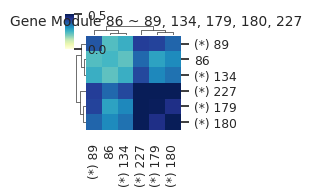

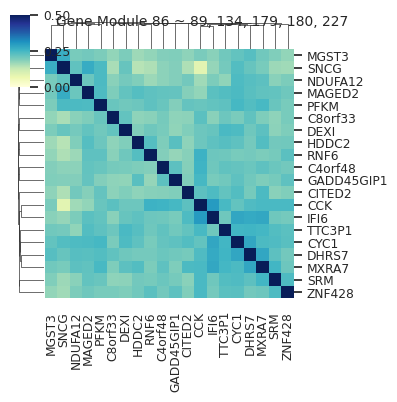

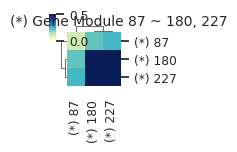

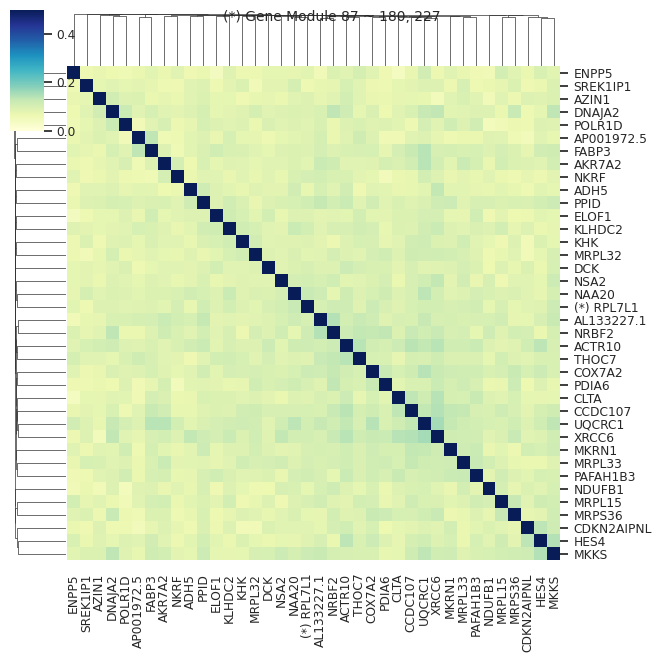

<Figure size 670x670 with 0 Axes>

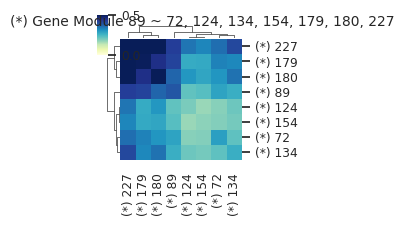

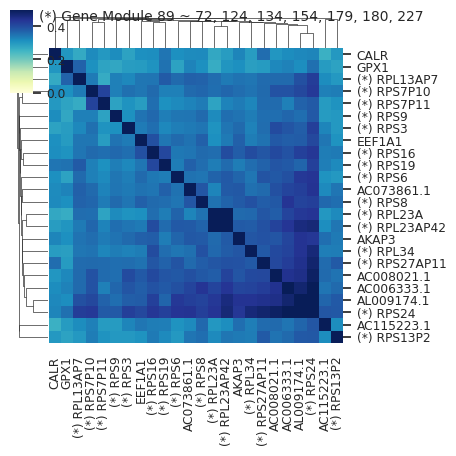

<Figure size 880x880 with 0 Axes>

<Figure size 520x520 with 0 Axes>

<Figure size 940x940 with 0 Axes>

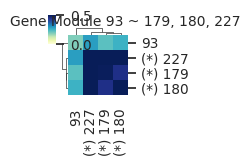

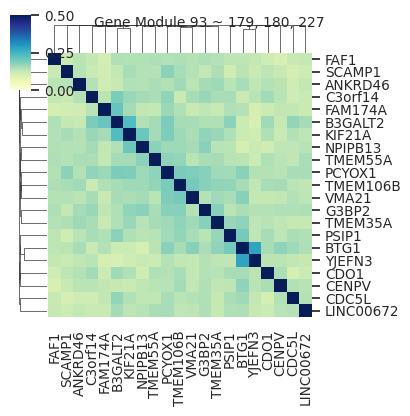

<Figure size 700x700 with 0 Axes>

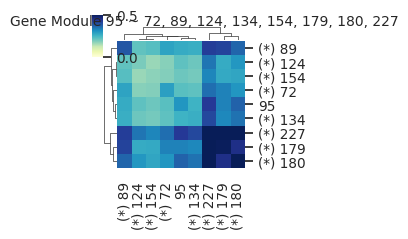

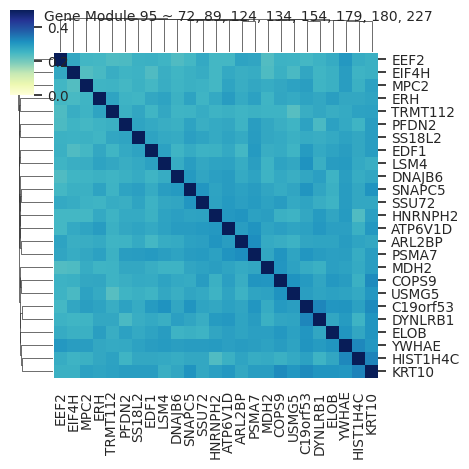

<Figure size 160x160 with 0 Axes>

<Figure size 1000x1000 with 0 Axes>

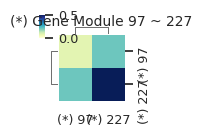

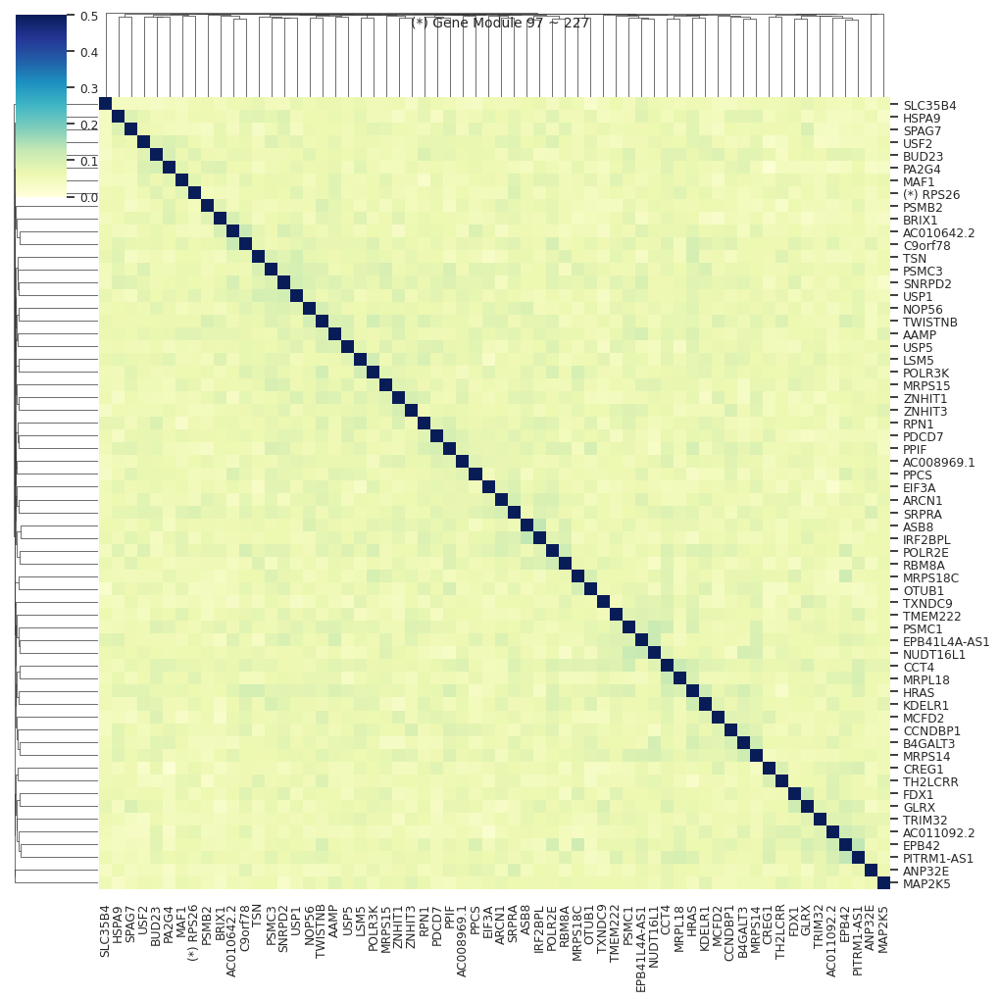

<Figure size 1000x1000 with 0 Axes>

<Figure size 415x415 with 0 Axes>

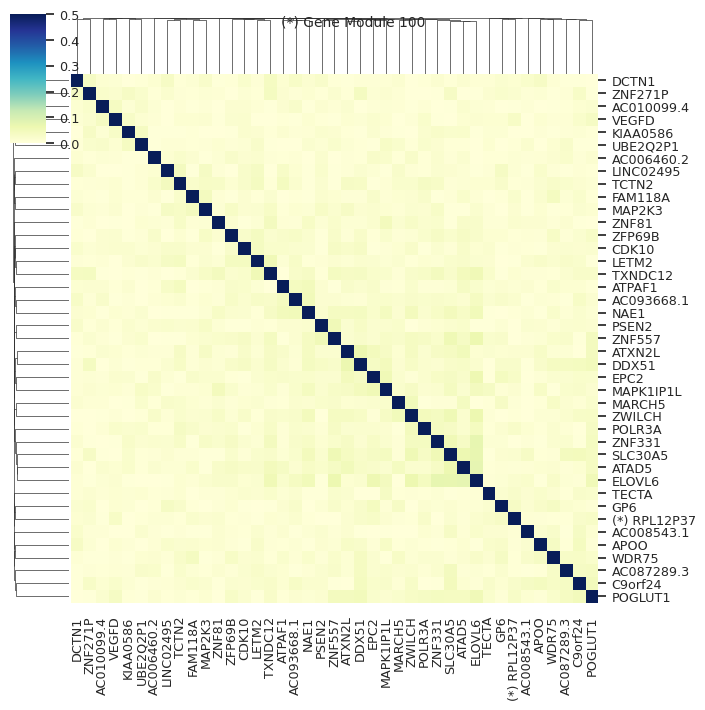

<Figure size 460x460 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 835x835 with 0 Axes>

<Figure size 490x490 with 0 Axes>

<Figure size 910x910 with 0 Axes>

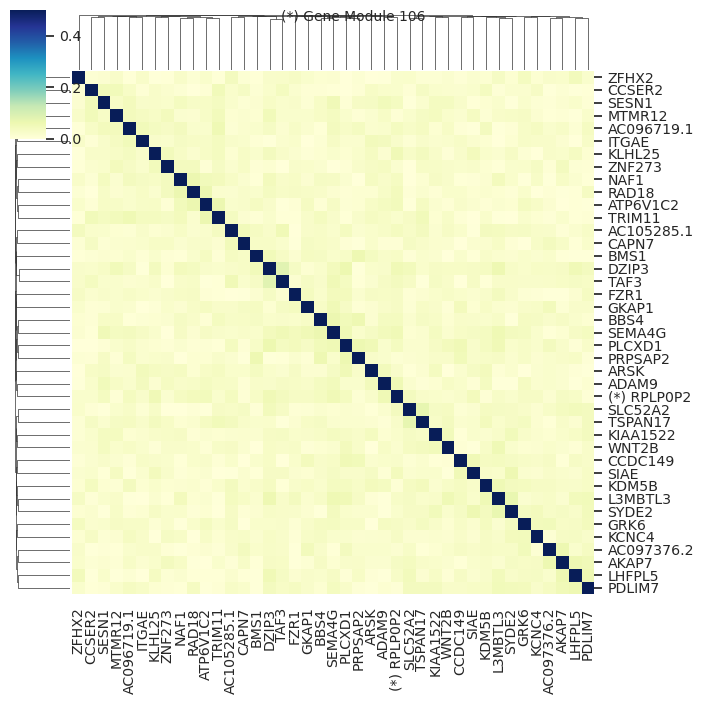

<Figure size 490x490 with 0 Axes>

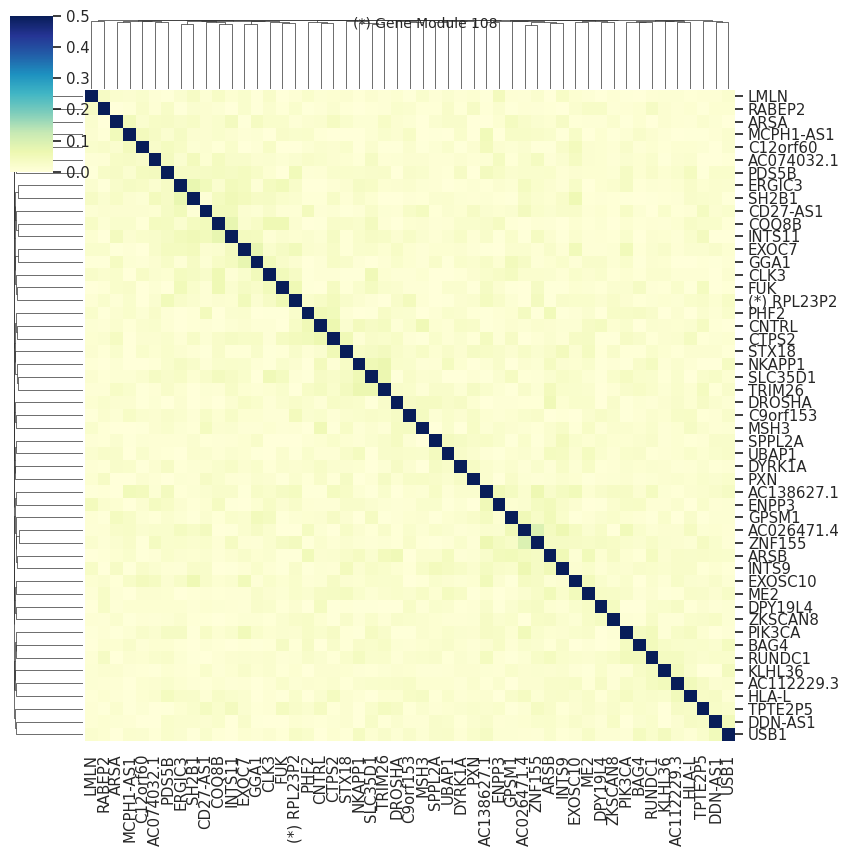

<Figure size 1030x1030 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 640x640 with 0 Axes>

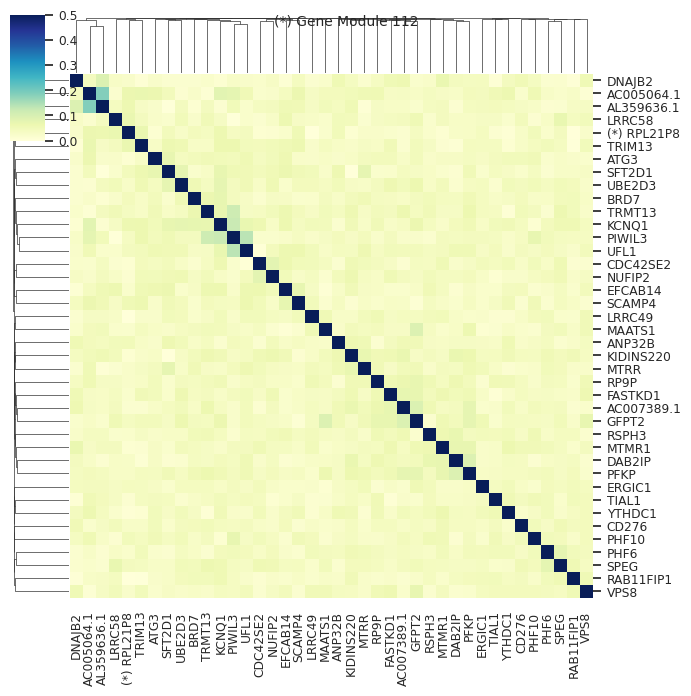

<Figure size 1030x1030 with 0 Axes>

<Figure size 685x685 with 0 Axes>

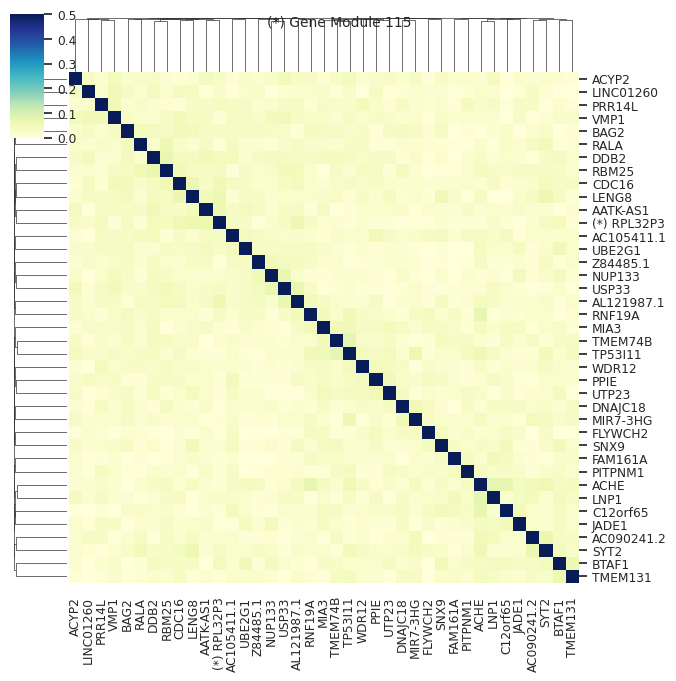

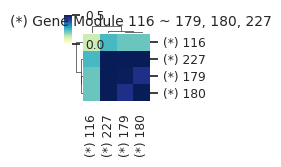

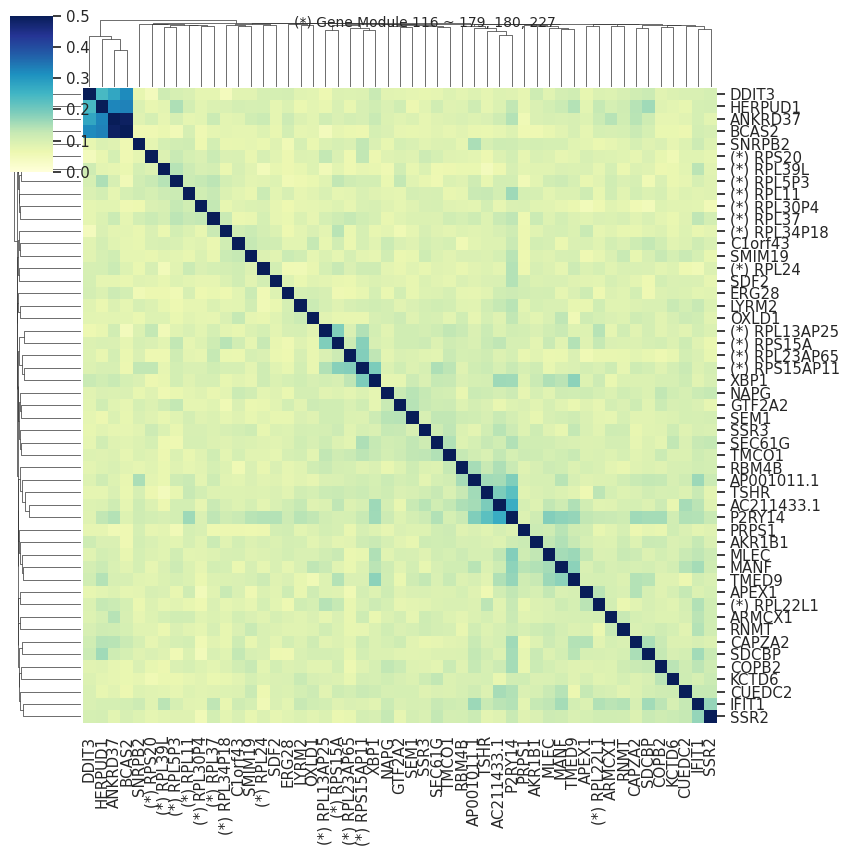

<Figure size 745x745 with 0 Axes>

<Figure size 625x625 with 0 Axes>

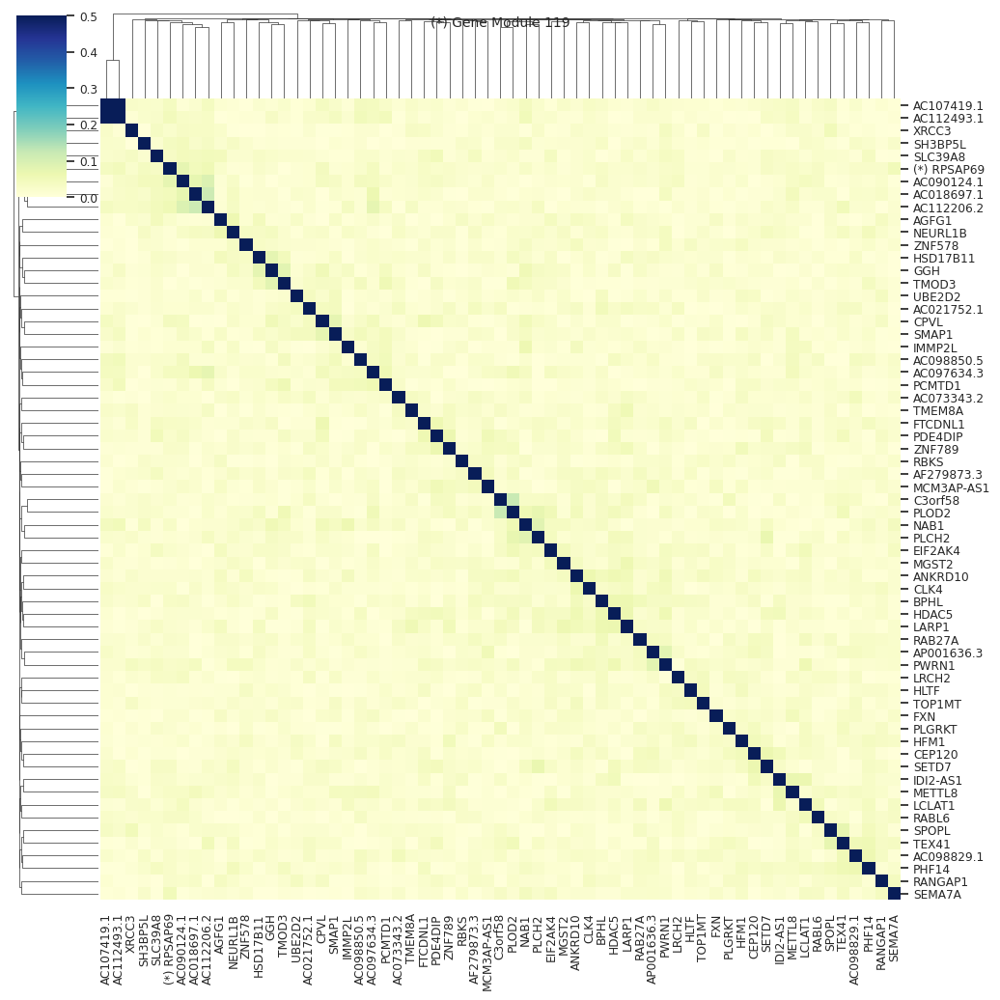

<Figure size 790x790 with 0 Axes>

<Figure size 865x865 with 0 Axes>

<Figure size 910x910 with 0 Axes>

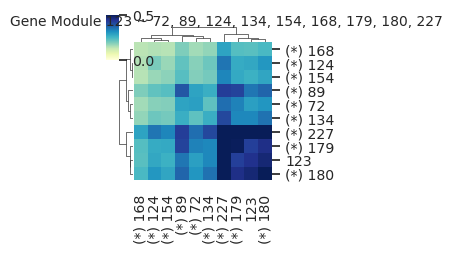

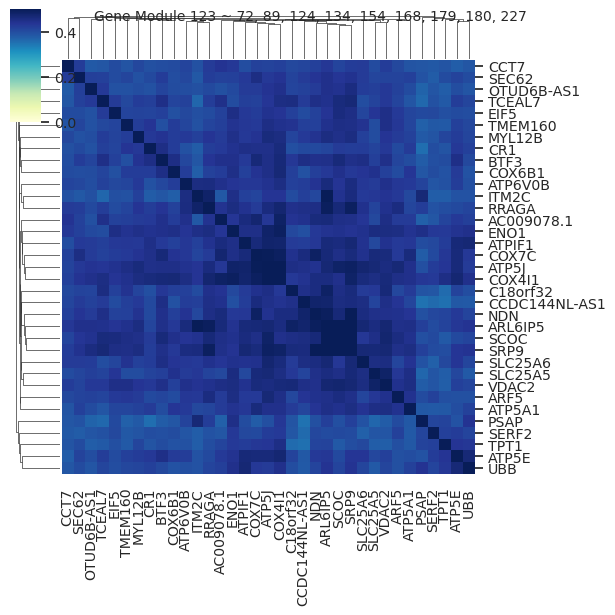

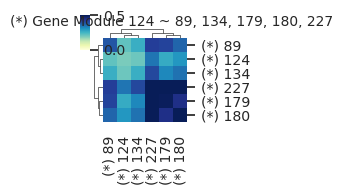

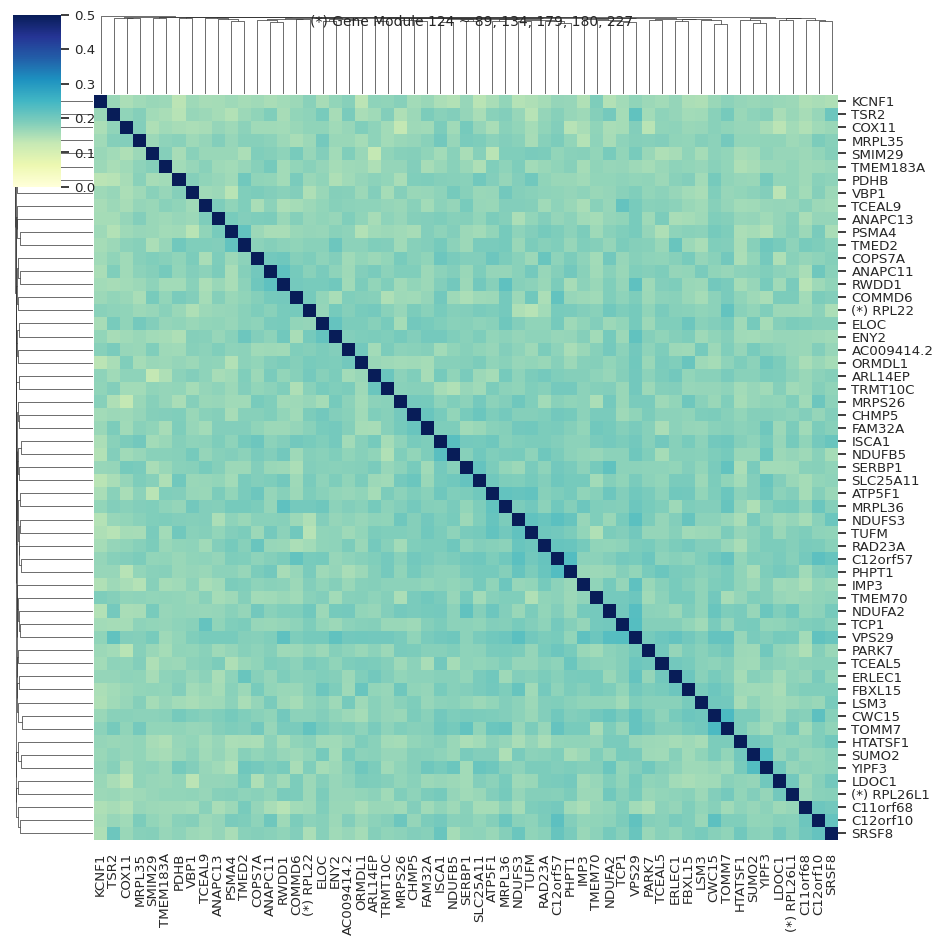

<Figure size 970x970 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 505x505 with 0 Axes>

<Figure size 400x400 with 0 Axes>

<Figure size 1030x1030 with 0 Axes>

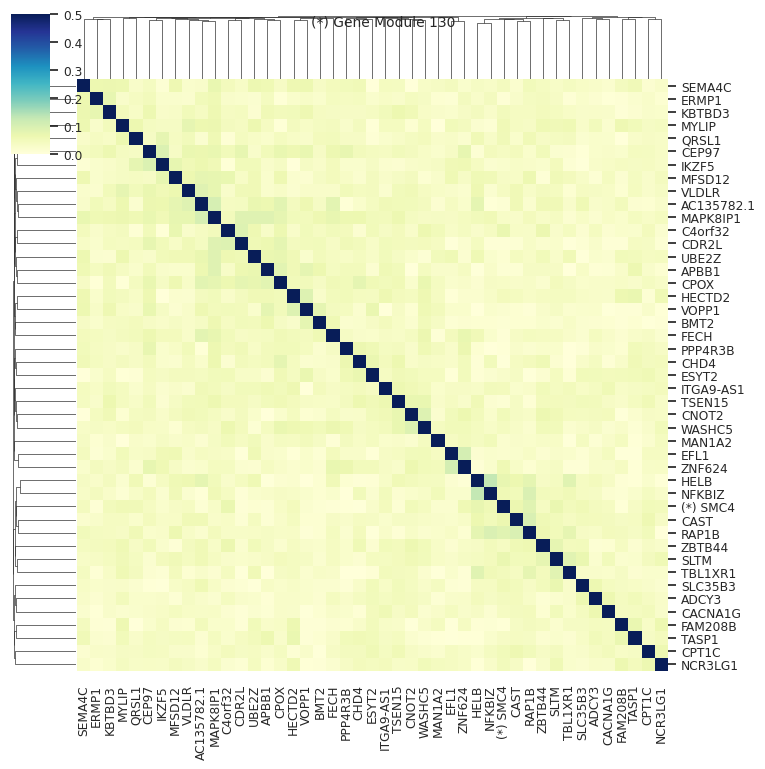

<Figure size 640x640 with 0 Axes>

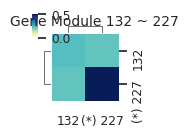

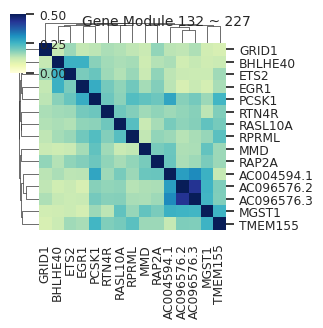

<Figure size 655x655 with 0 Axes>

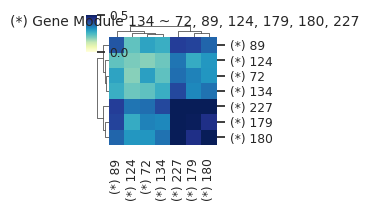

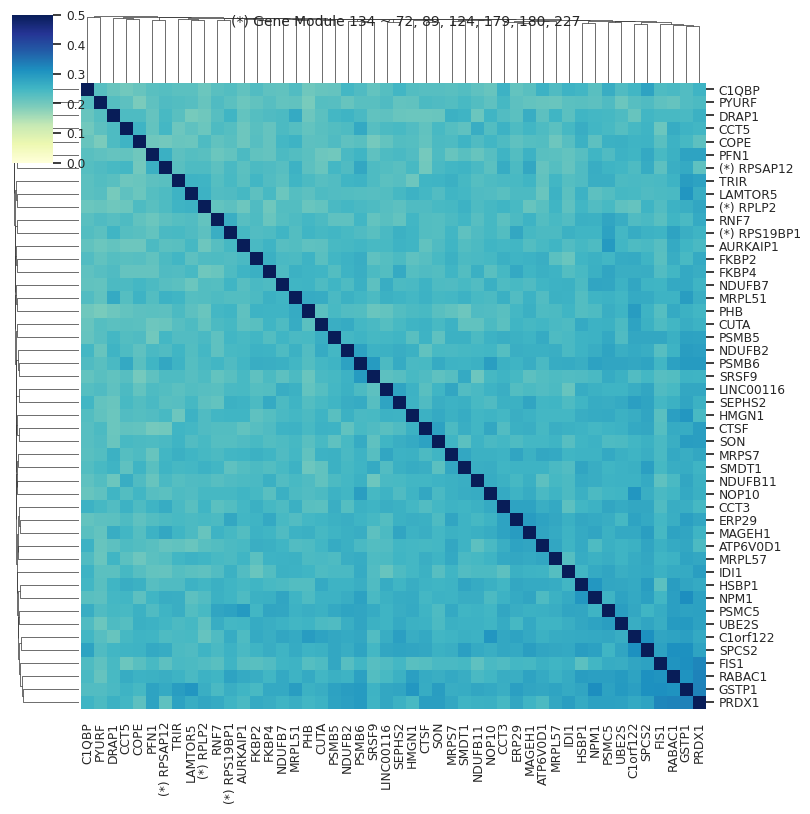

<Figure size 700x700 with 0 Axes>

<Figure size 1060x1060 with 0 Axes>

<Figure size 910x910 with 0 Axes>

<Figure size 445x445 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 640x640 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 1015x1015 with 0 Axes>

<Figure size 670x670 with 0 Axes>

<Figure size 640x640 with 0 Axes>

<Figure size 775x775 with 0 Axes>

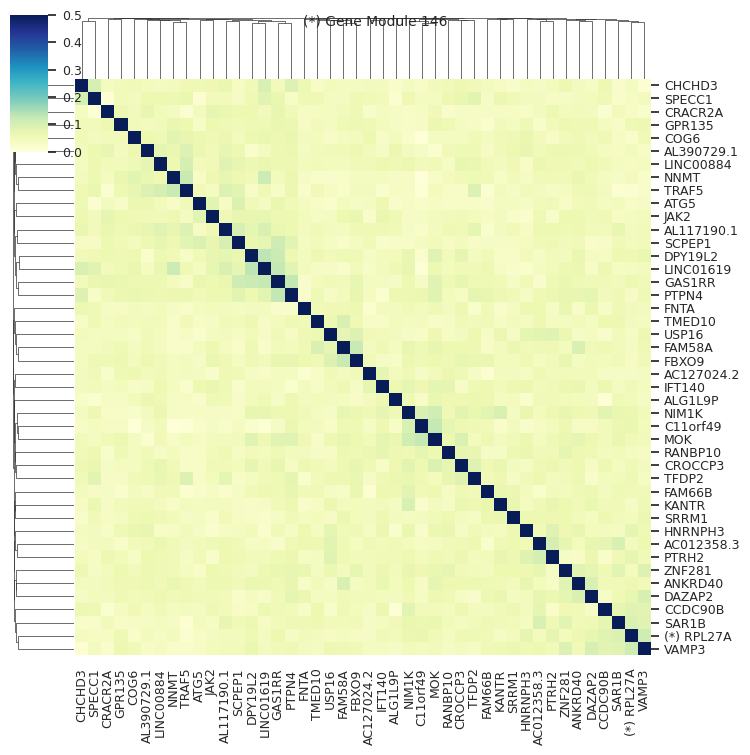

<Figure size 565x565 with 0 Axes>

<Figure size 370x370 with 0 Axes>

<Figure size 790x790 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 730x730 with 0 Axes>

<Figure size 655x655 with 0 Axes>

<Figure size 130x130 with 0 Axes>

<Figure size 955x955 with 0 Axes>

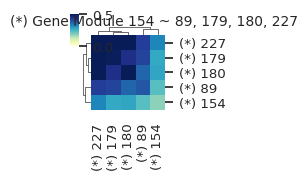

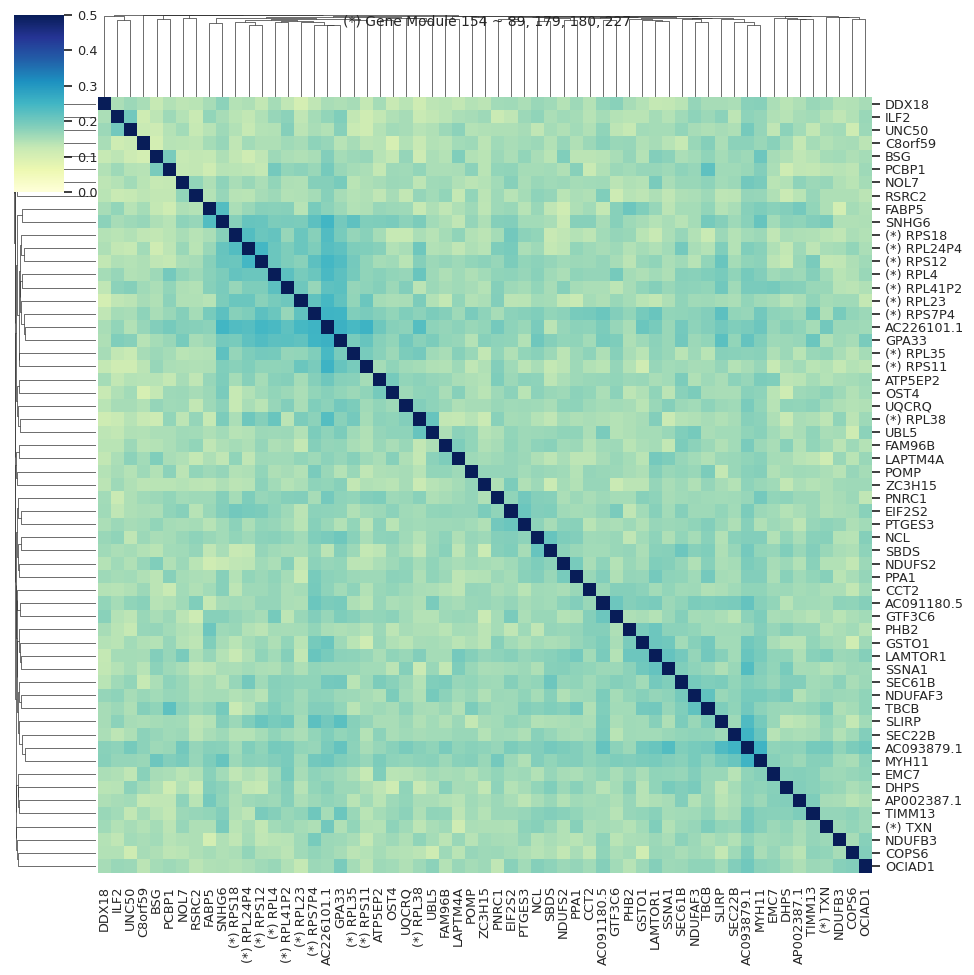

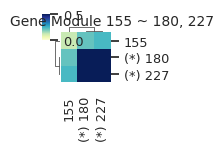

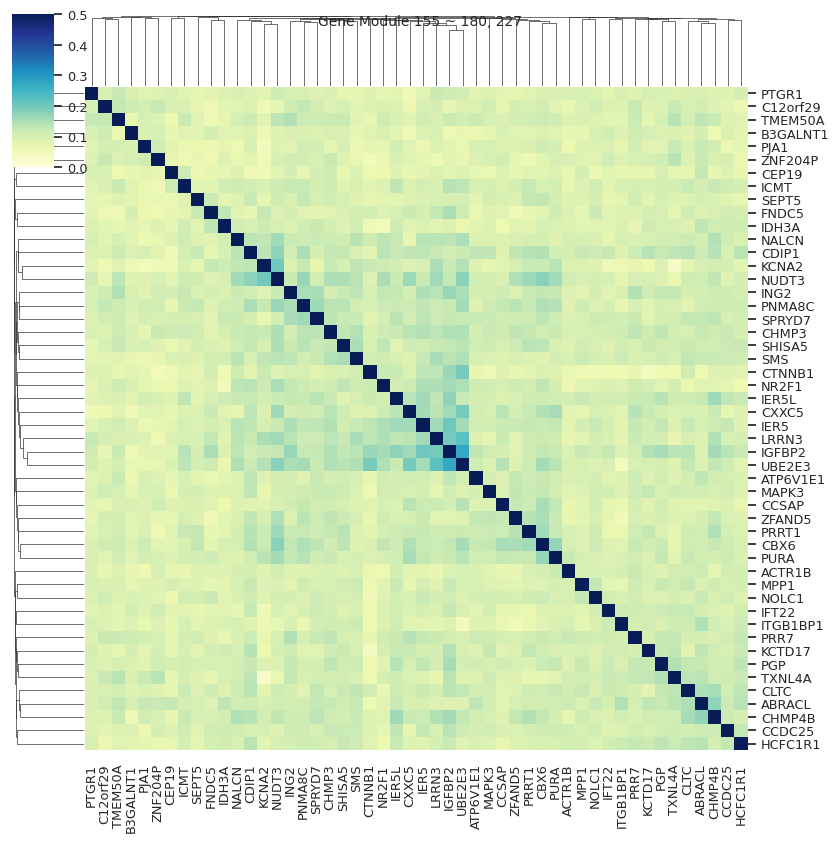

<Figure size 700x700 with 0 Axes>

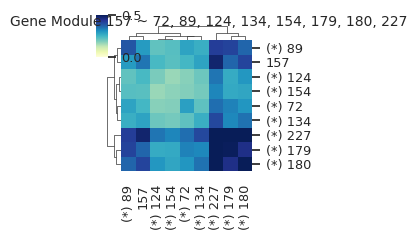

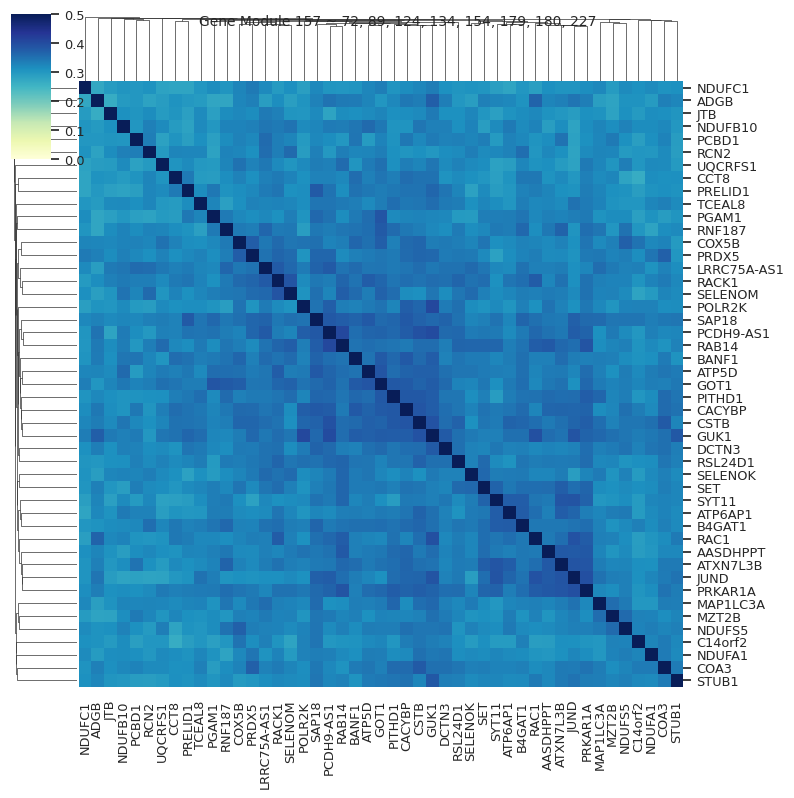

<Figure size 340x340 with 0 Axes>

<Figure size 310x310 with 0 Axes>

<Figure size 1045x1045 with 0 Axes>

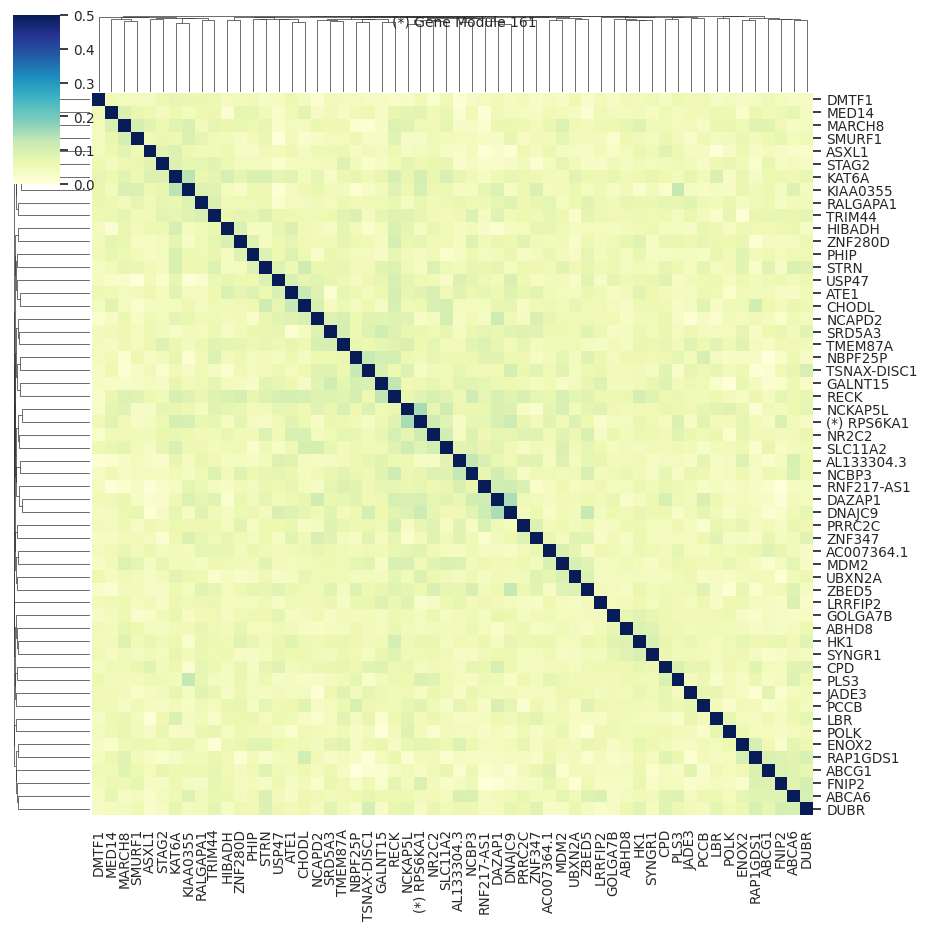

<Figure size 835x835 with 0 Axes>

<Figure size 475x475 with 0 Axes>

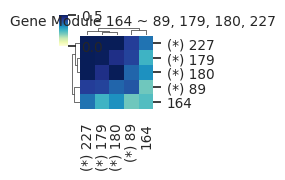

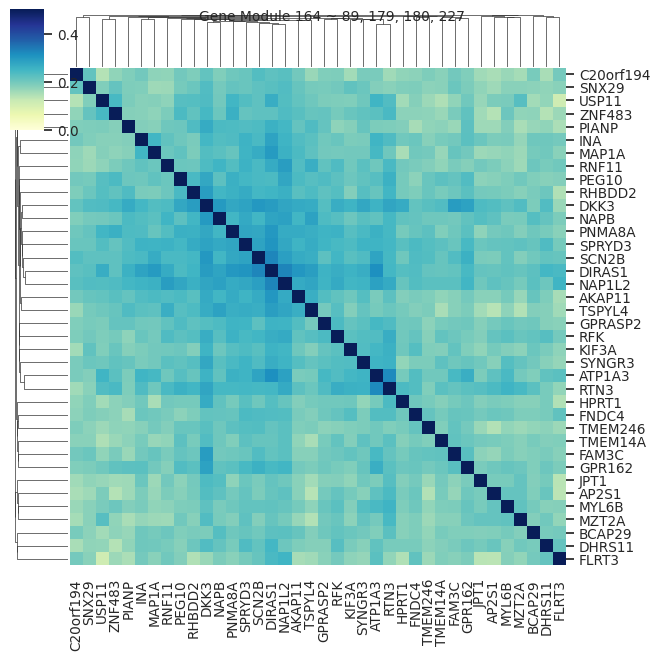

<Figure size 850x850 with 0 Axes>

<Figure size 475x475 with 0 Axes>

<Figure size 700x700 with 0 Axes>

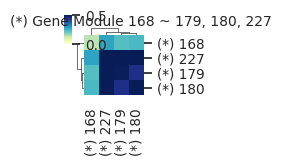

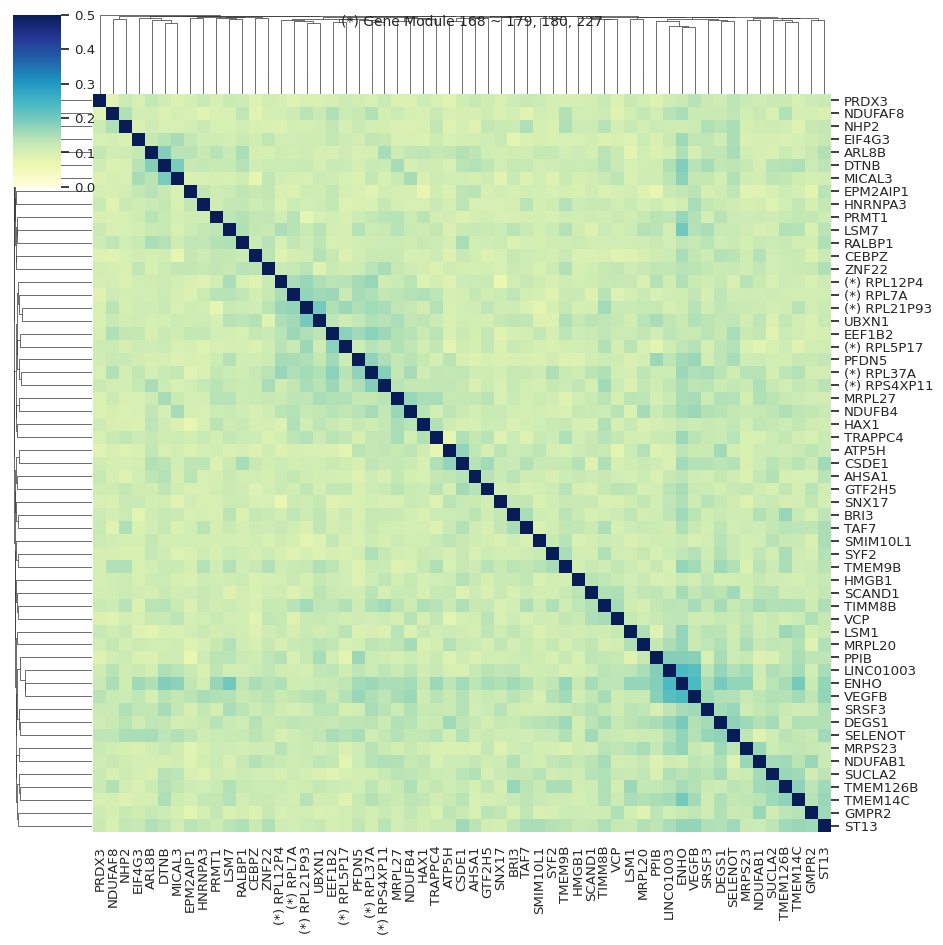

<Figure size 790x790 with 0 Axes>

<Figure size 805x805 with 0 Axes>

<Figure size 910x910 with 0 Axes>

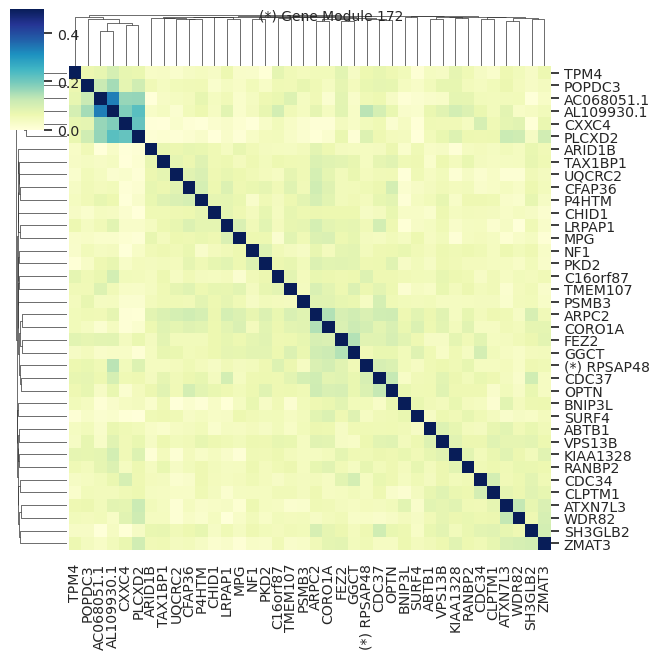

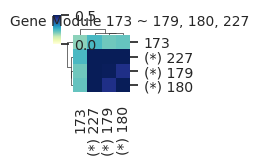

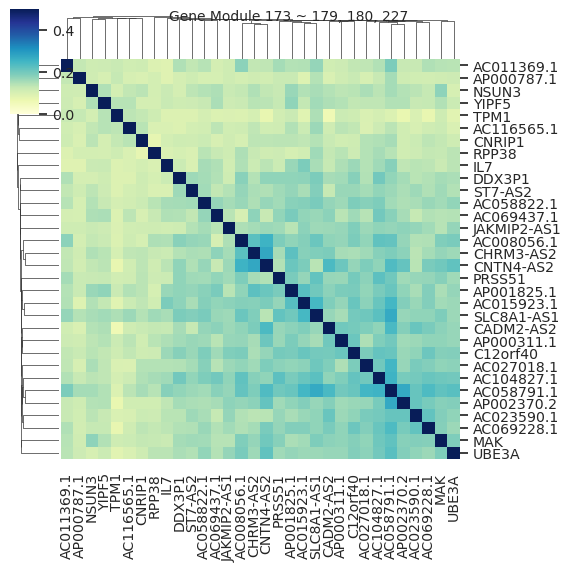

<Figure size 580x580 with 0 Axes>

<Figure size 385x385 with 0 Axes>

<Figure size 520x520 with 0 Axes>

<Figure size 865x865 with 0 Axes>

<Figure size 760x760 with 0 Axes>

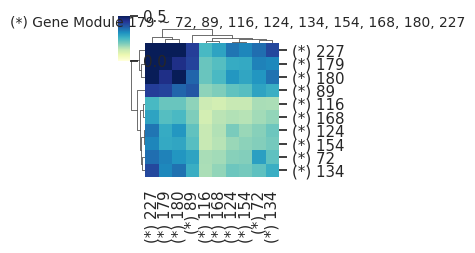

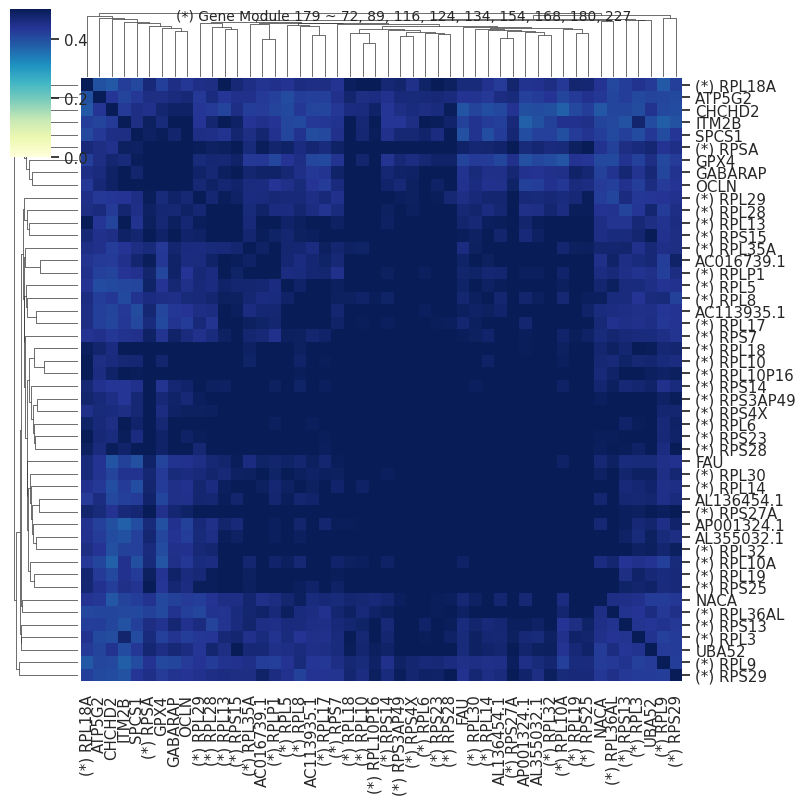

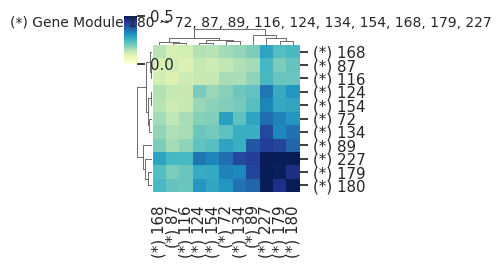

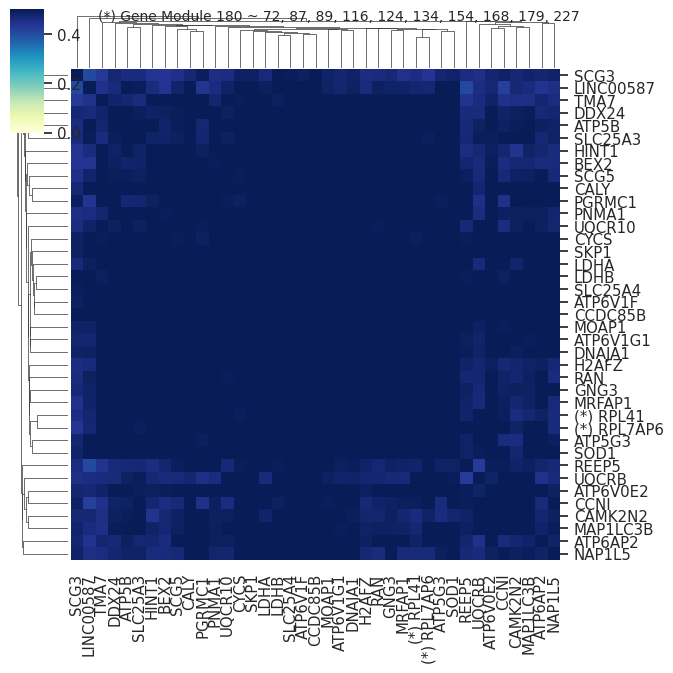

<Figure size 1030x1030 with 0 Axes>

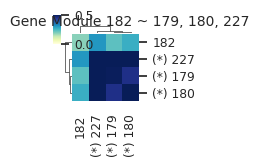

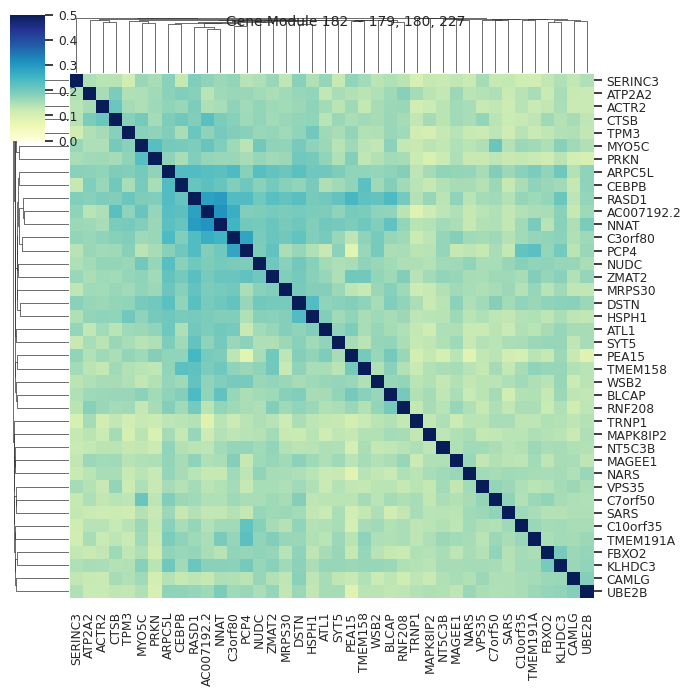

<Figure size 550x550 with 0 Axes>

<Figure size 475x475 with 0 Axes>

<Figure size 415x415 with 0 Axes>

<Figure size 565x565 with 0 Axes>

<Figure size 985x985 with 0 Axes>

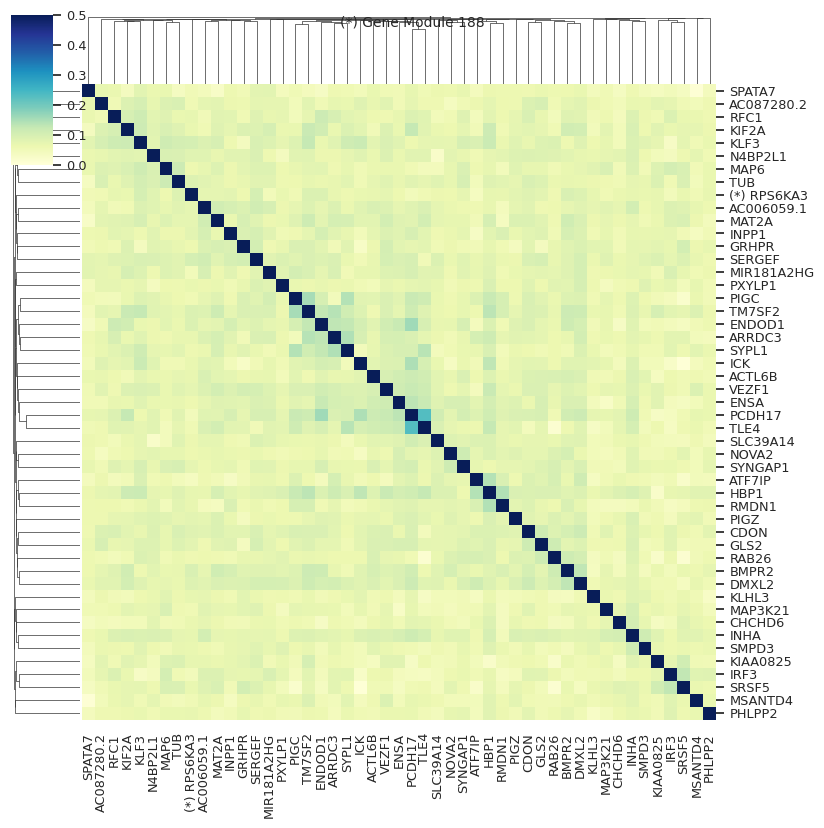

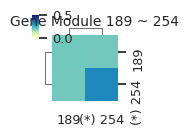

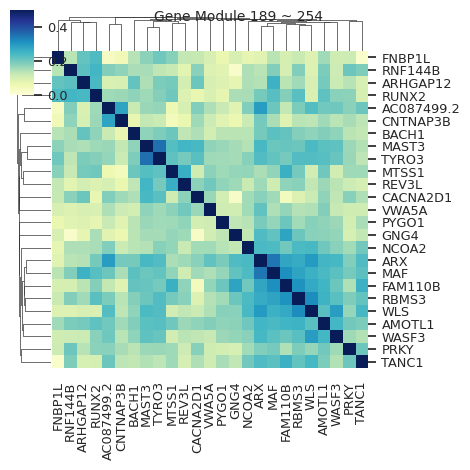

<Figure size 295x295 with 0 Axes>

<Figure size 895x895 with 0 Axes>

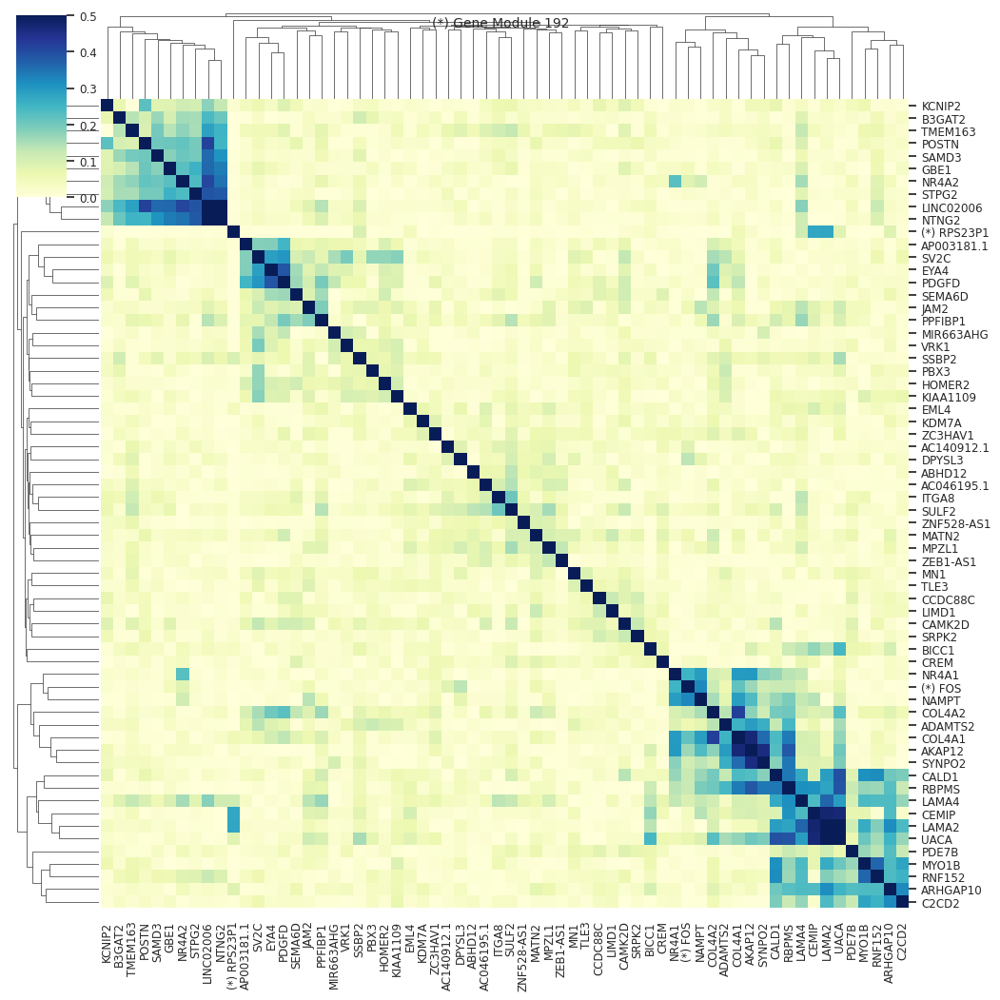

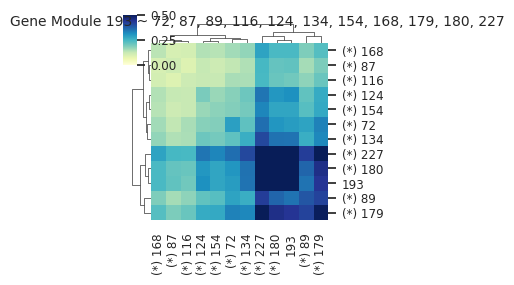

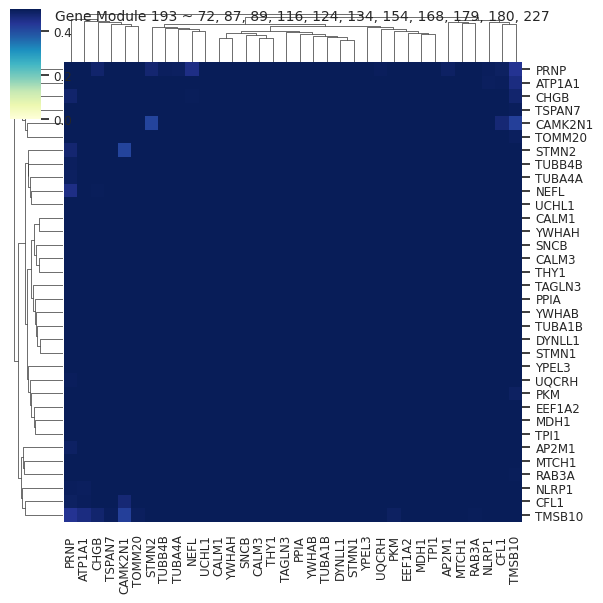

<Figure size 625x625 with 0 Axes>

<Figure size 685x685 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 685x685 with 0 Axes>

<Figure size 370x370 with 0 Axes>

<Figure size 925x925 with 0 Axes>

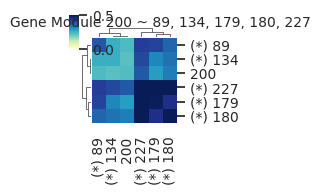

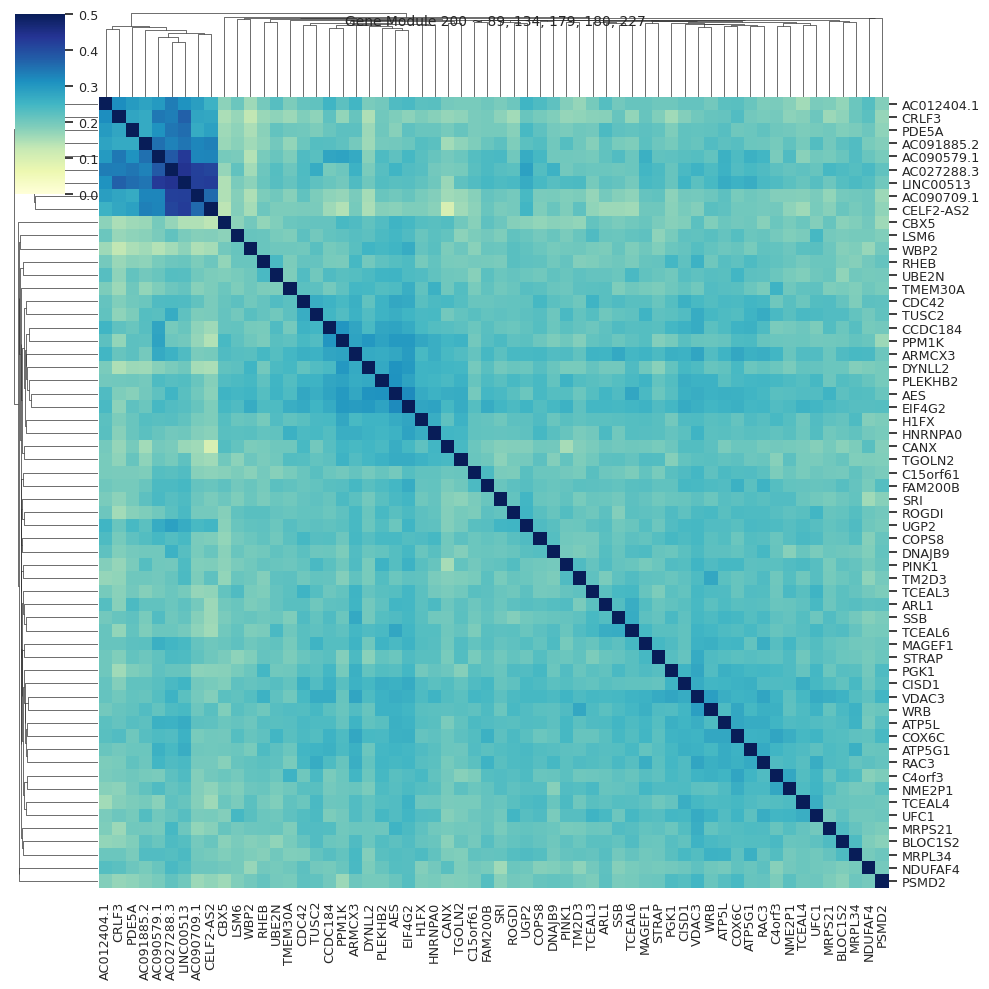

<Figure size 610x610 with 0 Axes>

<Figure size 700x700 with 0 Axes>

<Figure size 580x580 with 0 Axes>

<Figure size 745x745 with 0 Axes>

<Figure size 625x625 with 0 Axes>

<Figure size 655x655 with 0 Axes>

<Figure size 670x670 with 0 Axes>

<Figure size 580x580 with 0 Axes>

<Figure size 1045x1045 with 0 Axes>

<Figure size 490x490 with 0 Axes>

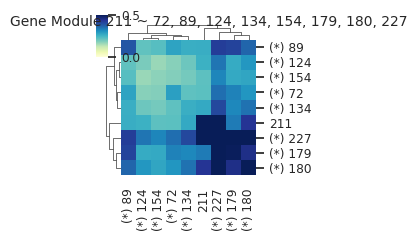

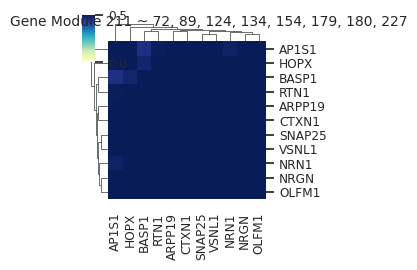

<Figure size 475x475 with 0 Axes>

<Figure size 910x910 with 0 Axes>

<Figure size 610x610 with 0 Axes>

<Figure size 1030x1030 with 0 Axes>

<Figure size 565x565 with 0 Axes>

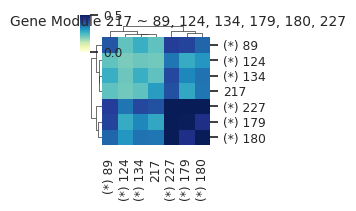

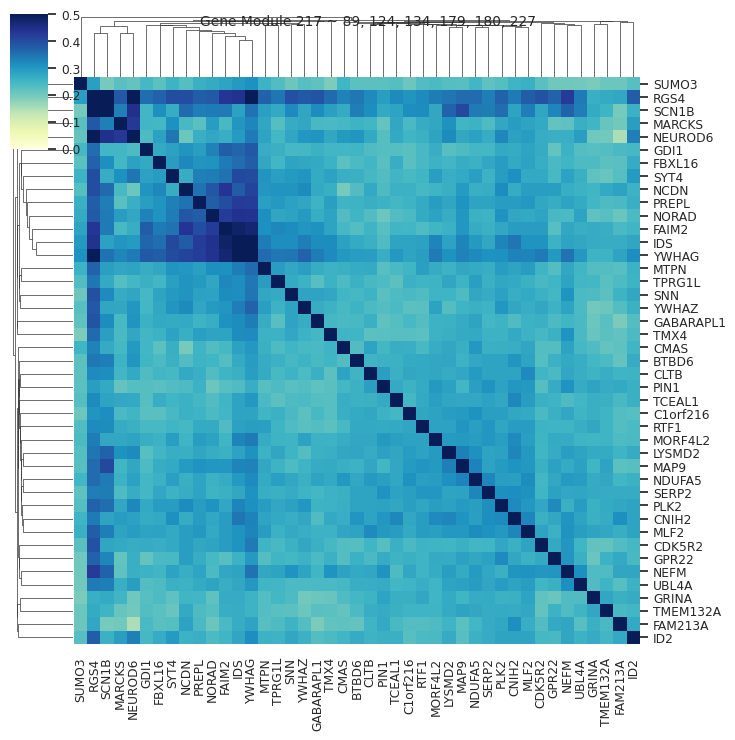

<Figure size 295x295 with 0 Axes>

<Figure size 940x940 with 0 Axes>

<Figure size 1060x1060 with 0 Axes>

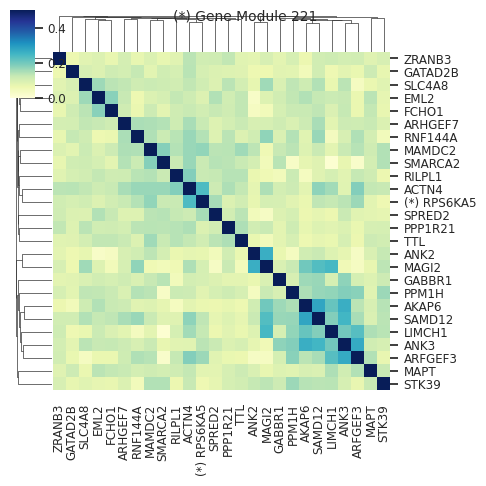

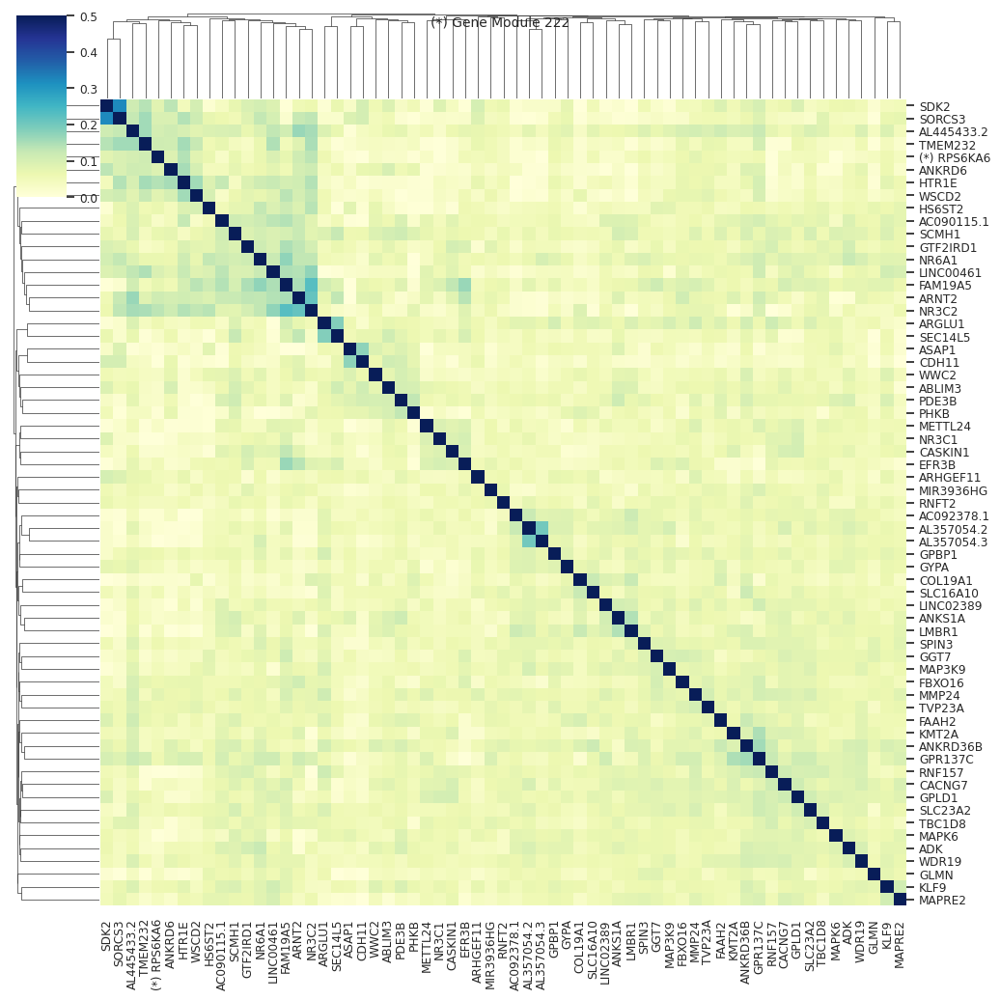

<Figure size 580x580 with 0 Axes>

<Figure size 970x970 with 0 Axes>

<Figure size 820x820 with 0 Axes>

<Figure size 745x745 with 0 Axes>

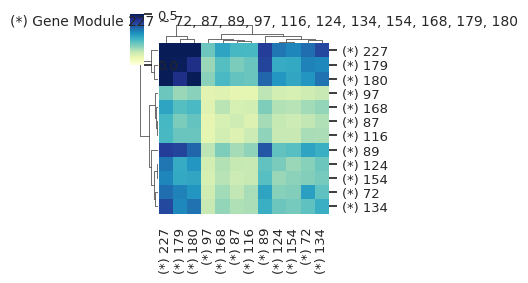

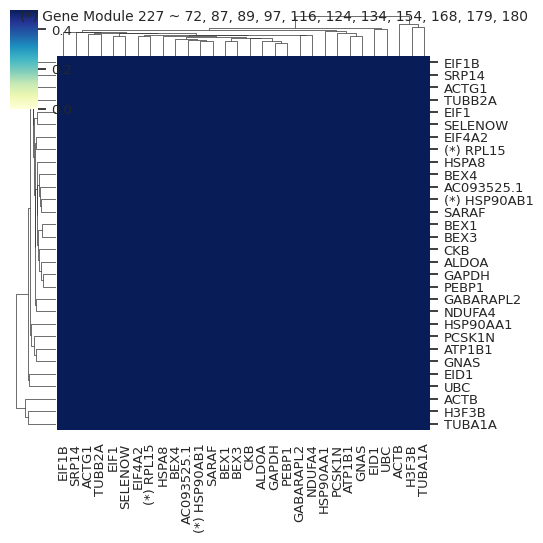

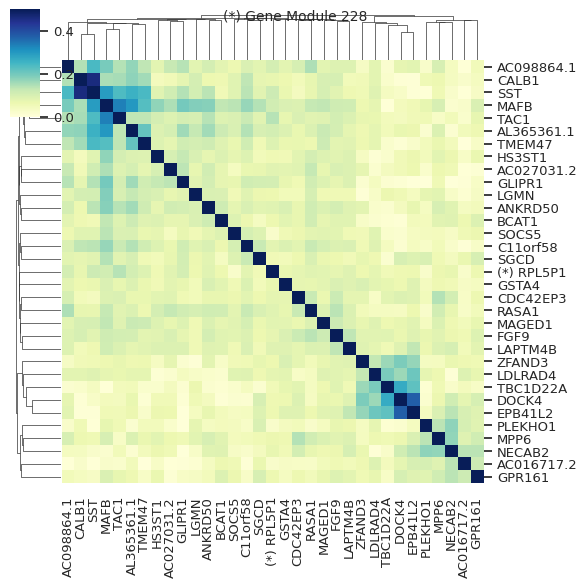

<Figure size 565x565 with 0 Axes>

<Figure size 835x835 with 0 Axes>

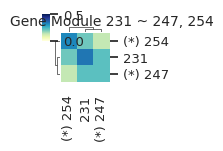

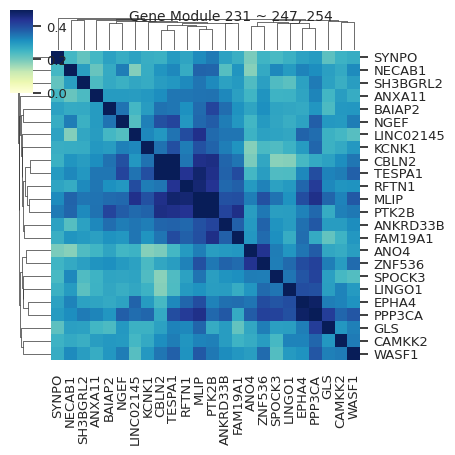

<Figure size 895x895 with 0 Axes>

<Figure size 490x490 with 0 Axes>

<Figure size 640x640 with 0 Axes>

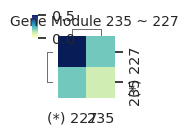

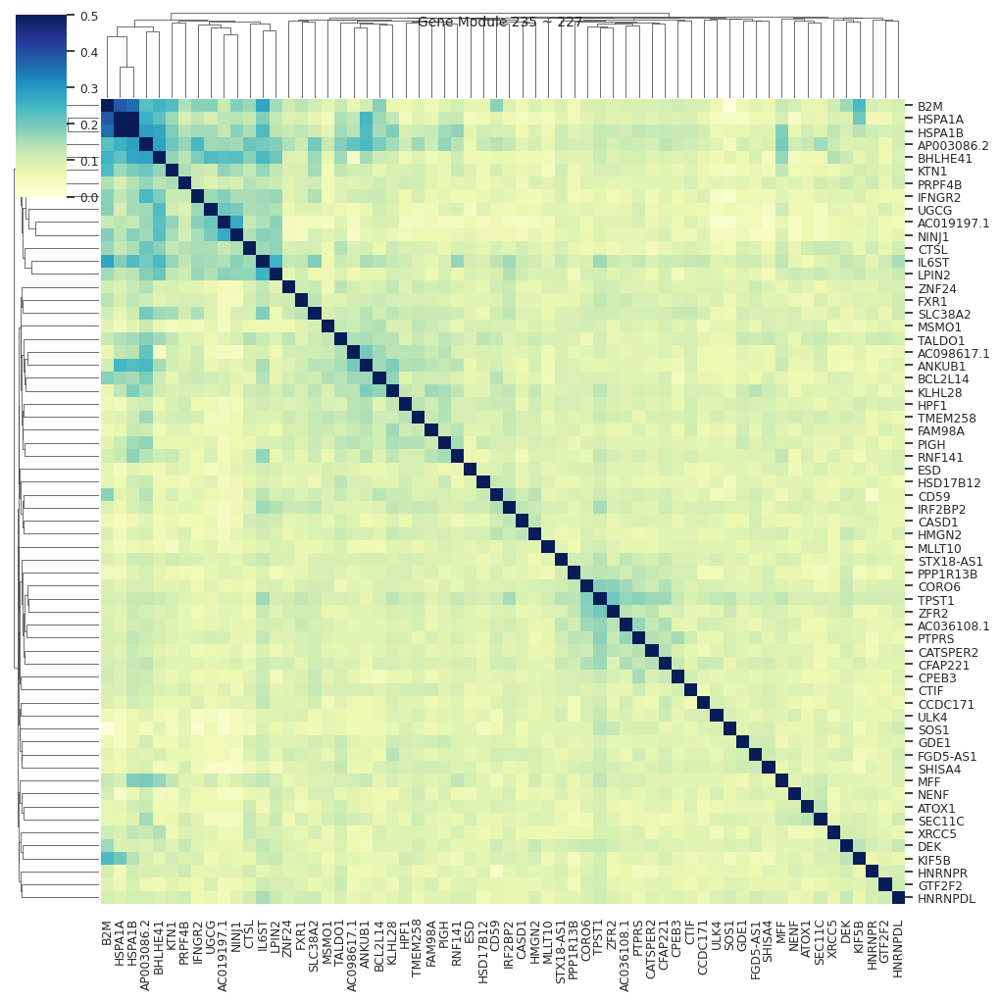

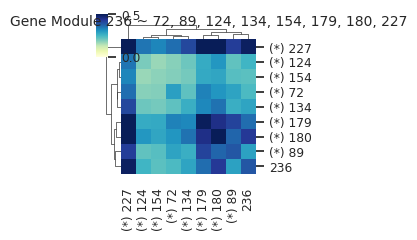

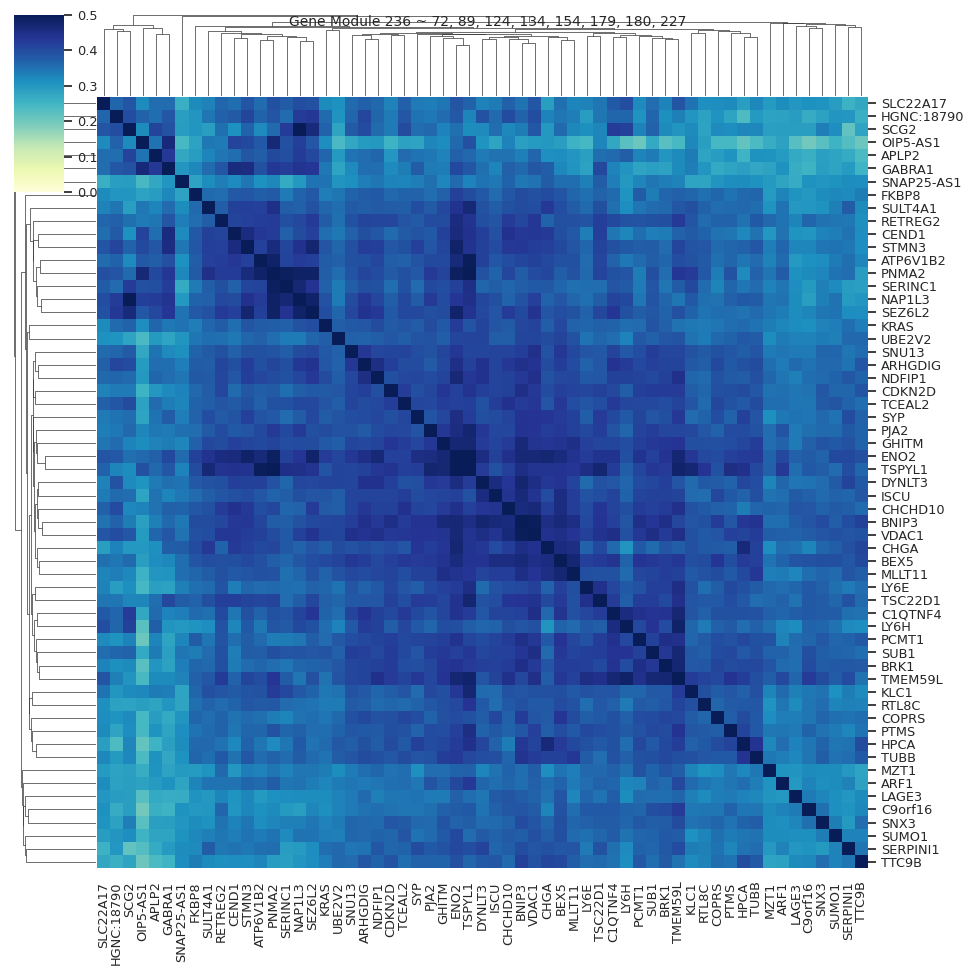

<Figure size 730x730 with 0 Axes>

<Figure size 760x760 with 0 Axes>

<Figure size 595x595 with 0 Axes>

<Figure size 880x880 with 0 Axes>

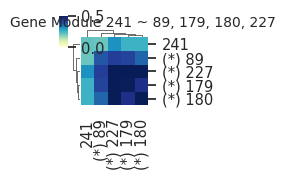

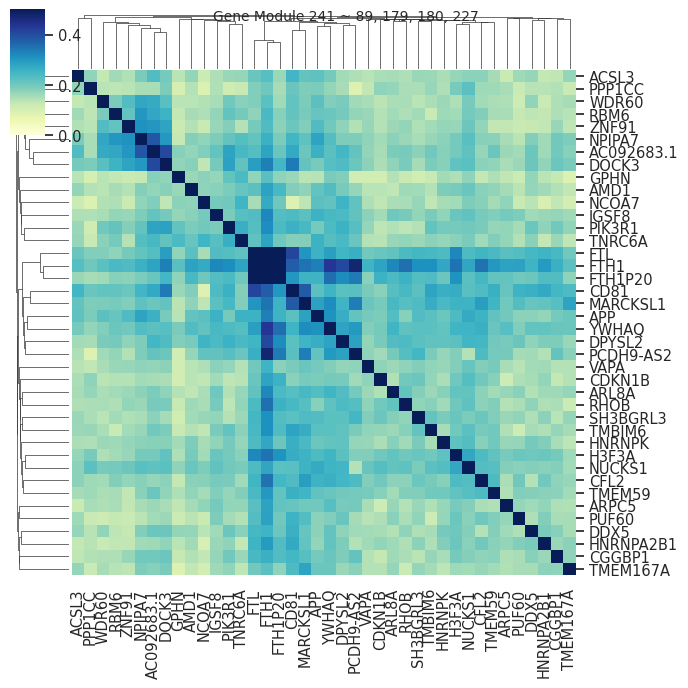

<Figure size 715x715 with 0 Axes>

<Figure size 925x925 with 0 Axes>

<Figure size 805x805 with 0 Axes>

<Figure size 775x775 with 0 Axes>

<Figure size 955x955 with 0 Axes>

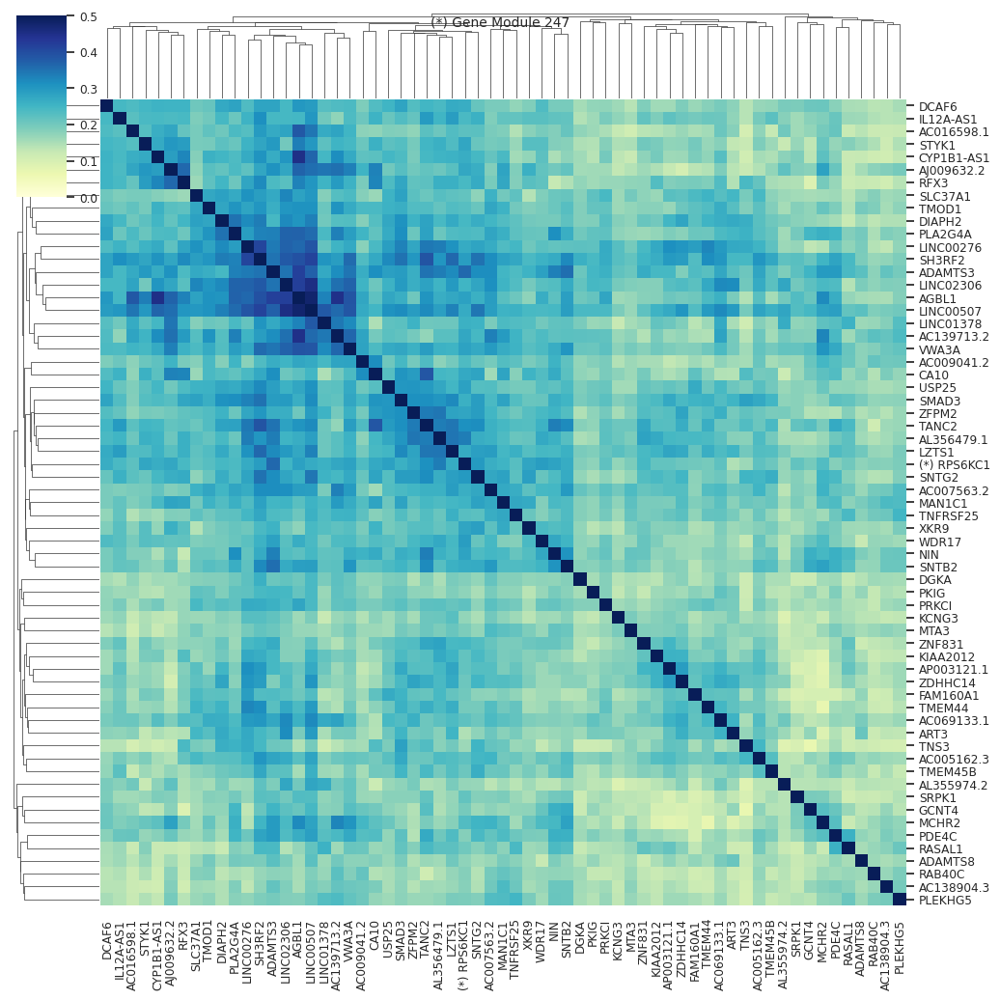

<Figure size 640x640 with 0 Axes>

<Figure size 610x610 with 0 Axes>

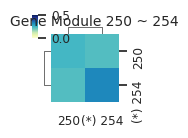

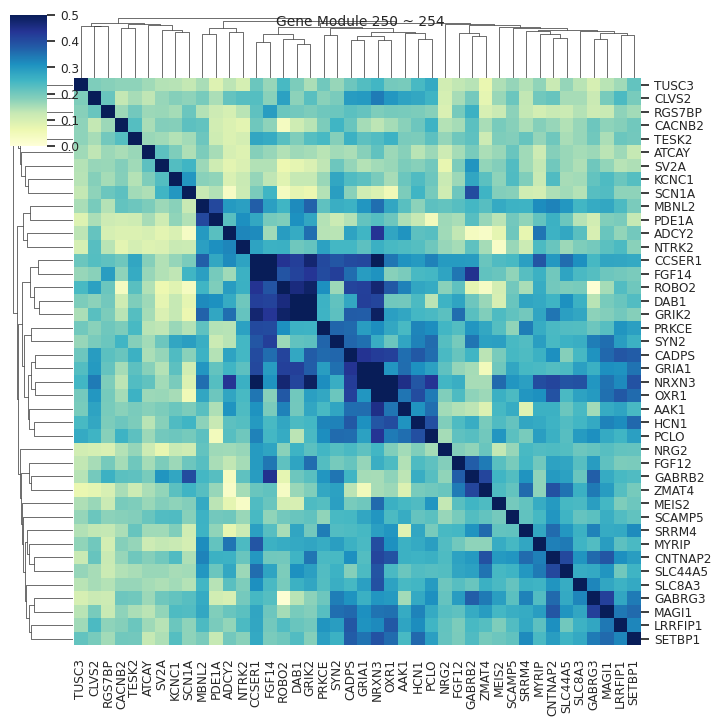

<Figure size 775x775 with 0 Axes>

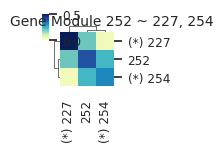

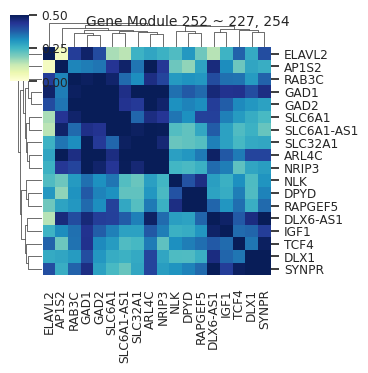

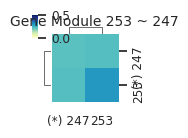

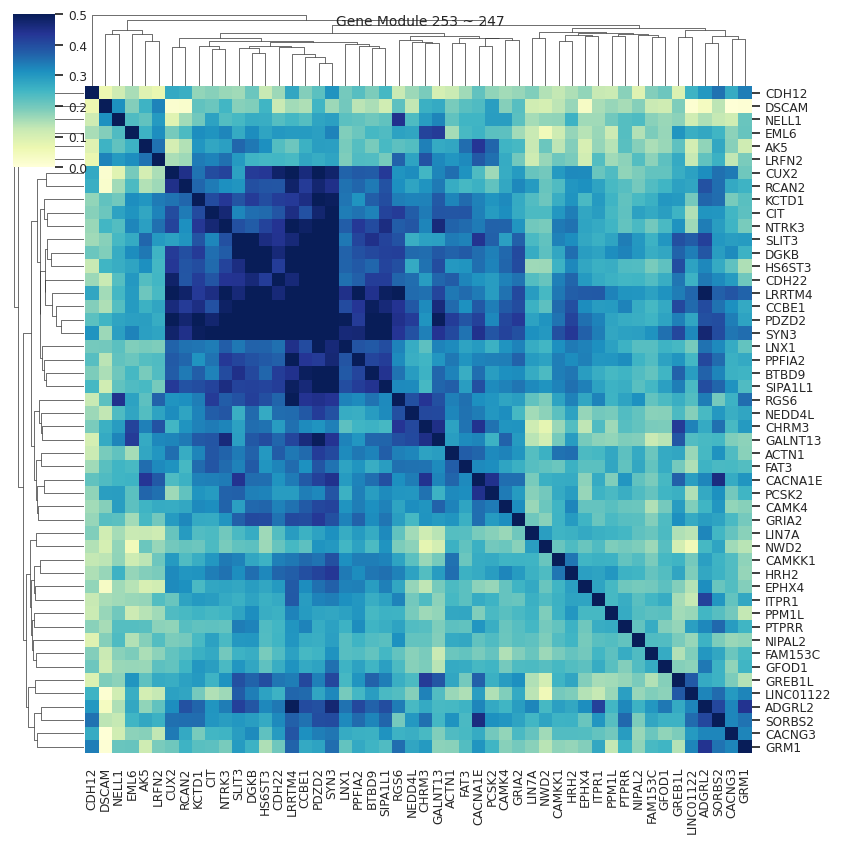

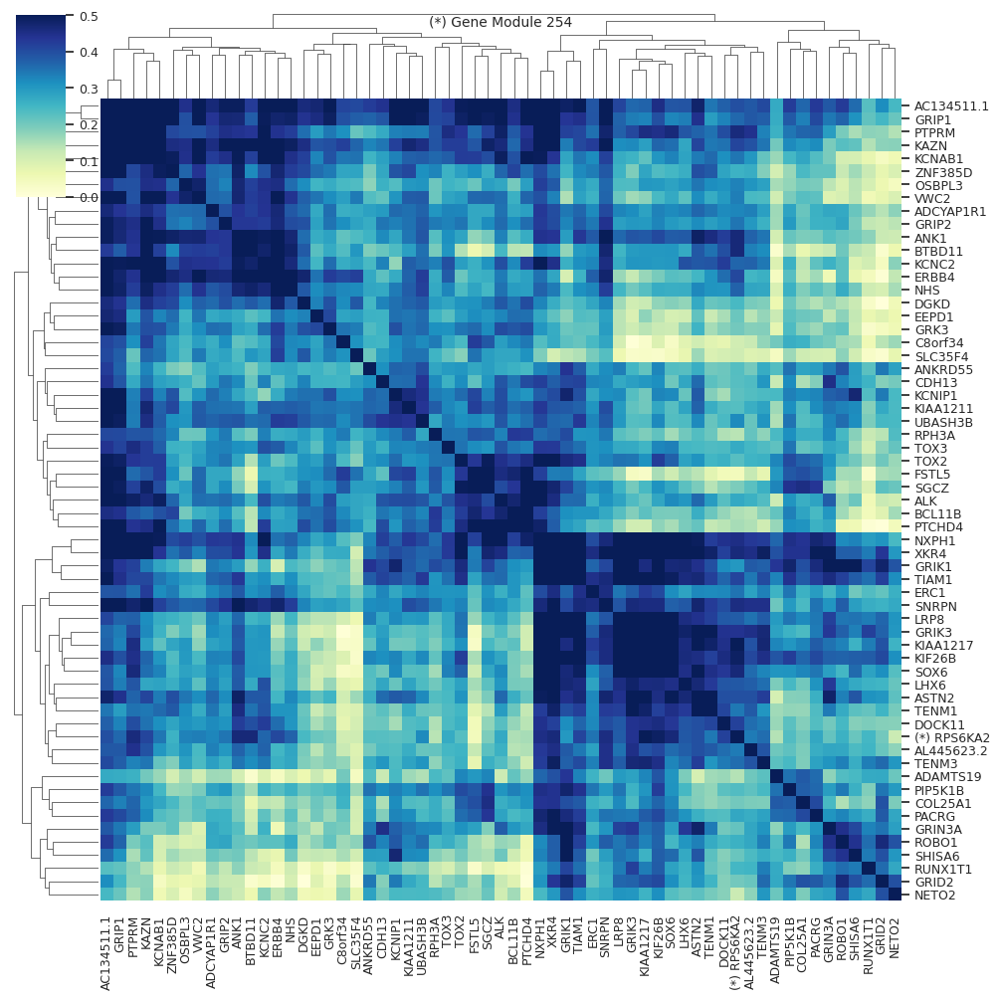

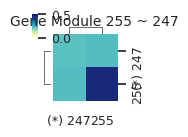

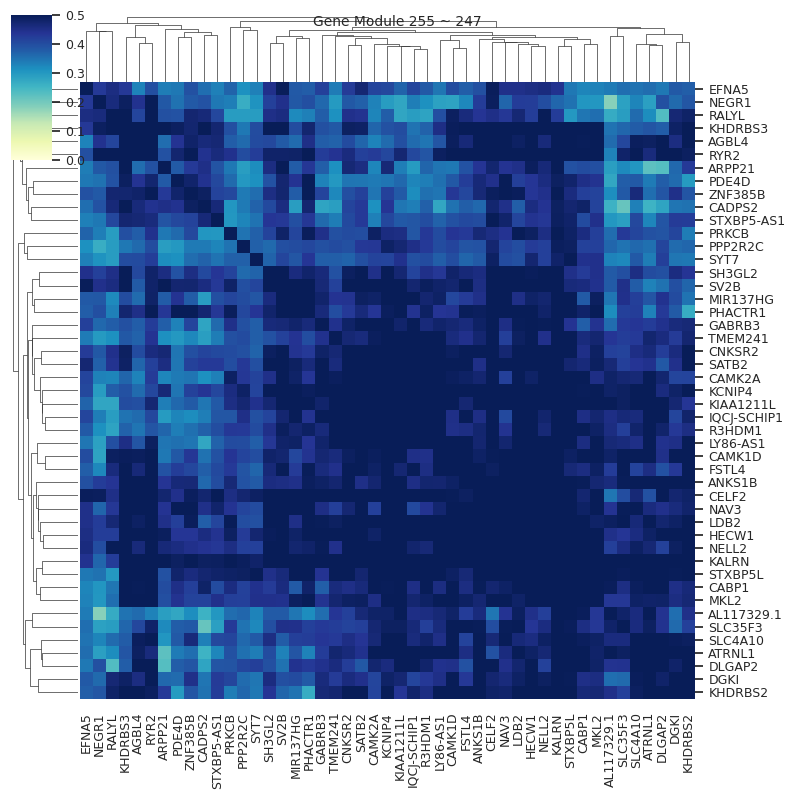

<Figure size 790x790 with 0 Axes>

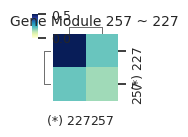

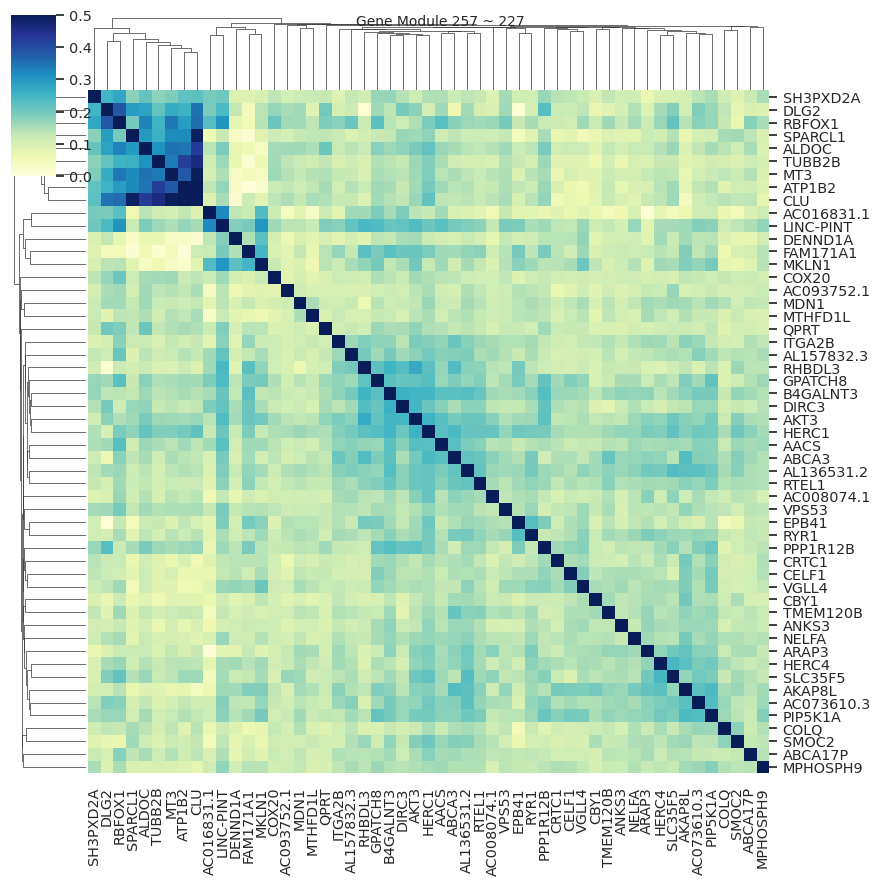

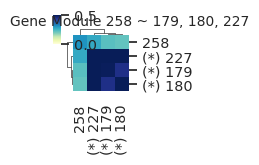

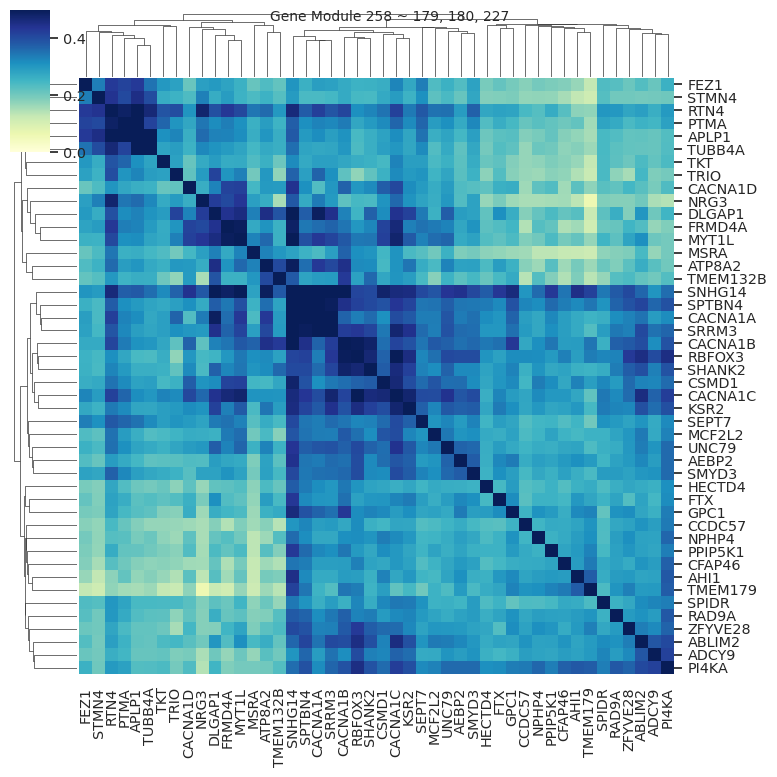

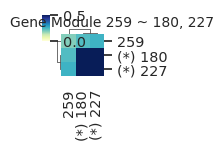

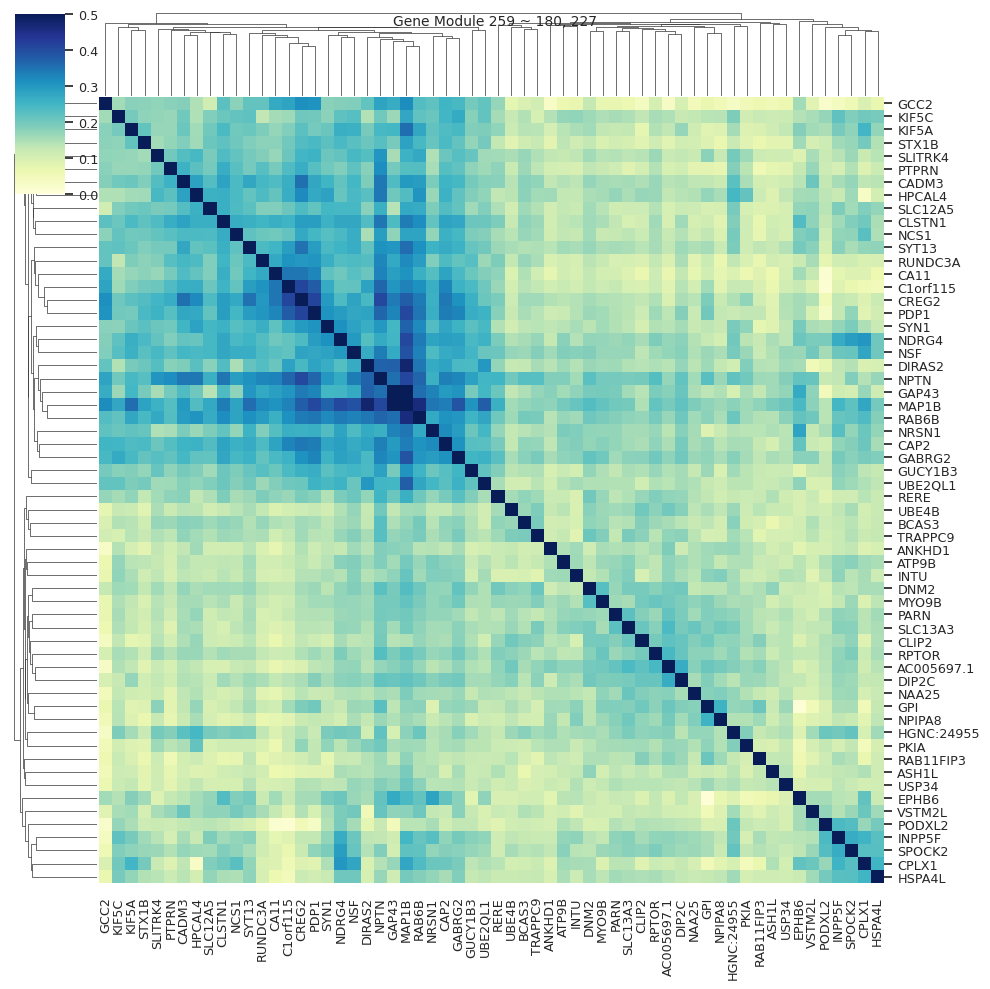

In [35]:
SHOW_CORRELATED_MODULES = 0.2 # Show non-lateral modules if correlated to lateral modules.
MIN_SIMILARITY_TO_SHOW = 0.2 # Show modules only if there's at least this correlation

base_lateral_gene_modules = np.unique(module_per_gene.values[base_lateral_genes_mask])
base_lateral_gene_modules = base_lateral_gene_modules[base_lateral_gene_modules >= 0]
similarity_of_genes = mc.ut.get_vv_frame(cells, "lateral_genes_similarity")

for gene_module in range(np.max(module_per_gene) + 1):
    module_genes_mask = module_per_gene.values == gene_module
    if module_per_gene[module_per_gene.values == gene_module].size > 1:
        similarity_of_module = similarity_of_genes.loc[module_genes_mask, module_genes_mask]
        similarity_of_module.index = similarity_of_module.columns = [
            "(*) " + name if name in base_lateral_gene_names else name
            for name in similarity_of_module.index
        ]
        
        mask = similarity_of_module.values.copy()
        np.fill_diagonal(mask, 0.0)
        max_value = np.max(mask)
        show_in_notebook = gene_module in base_lateral_gene_modules or max_value >= MIN_SIMILARITY_TO_SHOW
     
        similarity_to_laterals = similarity_of_modules.iloc[gene_module, base_lateral_gene_modules]
        similar_lateral_modules_mask = similarity_to_laterals >= SHOW_CORRELATED_MODULES
        similar_lateral_modules = base_lateral_gene_modules[np.where(similar_lateral_modules_mask)[0]]
        if gene_module not in base_lateral_gene_modules and len(similar_lateral_modules) == 0:
            show_in_notebook = False
            
        prefix = "(*) " if gene_module in base_lateral_gene_modules else ""
        suffix = ", ".join([
            str(similar_lateral_module)
            for similar_lateral_module
            in similar_lateral_modules
            if similar_lateral_module != gene_module
        ])
        if suffix != "":
            suffix = " ~ " + suffix
        title = f"{prefix}Gene Module {gene_module}{suffix}"
            
        if len(similar_lateral_modules) > 0:
            with_lateral_modules = set(similar_lateral_modules)
            with_lateral_modules.add(gene_module)
            with_lateral_modules = sorted(with_lateral_modules)
            if len(with_lateral_modules) > 1:
                similarity_with_module = \
                    similarity_of_modules.iloc[with_lateral_modules, :].iloc[:, with_lateral_modules]
    
                size = similarity_with_module.shape[0]
                if size > 50:
                    sb.set(font_scale=50 / size)
                size = size * 0.15 + 1
                cm = sb.clustermap(
                    similarity_with_module,
                    figsize=(size, size),
                    vmin=0, vmax=0.5,
                    xticklabels=True, yticklabels=True,
                    dendrogram_ratio=0.1,
                    cmap="YlGnBu",
                )
                cm.fig.suptitle(title, fontsize=10)
                if show_in_notebook:
                    plt.show()
                else:
                    plt.clf()
    
        size = similarity_of_module.shape[0]
        if size > 50:
            sb.set(font_scale=50 / size)
        size = size * 0.15 + 1
        cm = sb.clustermap(
            similarity_of_module,
            figsize=(size, size),
            vmin=0, vmax=0.5,
            xticklabels=True, yticklabels=True,
            dendrogram_ratio=0.1,
            cmap="YlGnBu",
        )
        cm.fig.suptitle(title, fontsize=10)
        if show_in_notebook:
            plt.show()
        else:
            plt.clf()

In [36]:
LATERAL_GENE_MODULES = [
    72, 89, 116, 124, 134, 154, 168, 179, 180, 227
]
SPECIFIC_LATERAL_GENES = ["DUSP1"]  # Stress

In [37]:
for gene_module in LATERAL_GENE_MODULES:
    module_genes_mask = module_per_gene == gene_module
    update_lateral_genes(names=cells.var_names[module_genes_mask], op="add", show=False)
update_lateral_genes(names=SPECIFIC_LATERAL_GENES, op="add", show=False)


set gorilla_mtg_iteration1.var[lateral_gene]: 731 true (1.781%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 740 true (1.803%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 778 true (1.895%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 833 true (2.029%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 878 true (2.139%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 926 true (2.256%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 977 true (2.38%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 992 true (2.417%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 1029 true (2.507%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 1057 true (2.575%) out of 41048 bools
set gorilla_mtg_iteration1.var[lateral_gene]: 1058 true (2.577%) out of 41048 bools


In [41]:
LATERAL_GENE_MODULES

[72, 89, 116, 124, 134, 154, 168, 179, 180, 227]

In [42]:
# Either use the guesstimator:
max_parallel_piles = mc.pl.guess_max_parallel_piles(cells)
# Or, if running out of memory manually override:
# max_paralle_piles = ...
print(max_parallel_piles)
mc.pl.set_max_parallel_piles(max_parallel_piles)

316


In [43]:
with mc.ut.progress_bar():
    mc.pl.divide_and_conquer_pipeline(cells, random_seed=123456, )

Detect rare gene modules...
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
  0%|          [00:00]/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/lib/python3.11/site-packages/anndata/_core/anndata.py:1118: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):
/nfs/research/icortes/ysong/anaconda3/envs/metacells094/

In [44]:
metacells = mc.pl.collect_metacells(cells, name="gorilla_mtg_metacells", random_seed=123456)
print(f"Iteration 1: {metacells.n_obs} metacells, {metacells.n_vars} genes")

set gorilla_mtg_metacells.obs[grouped]: 6501 int64s
set gorilla_mtg_metacells.obs[total_umis]: 6501 int64s
set gorilla_mtg_metacells.layers[total_umis]: ndarray 6501 X 41048 float32s
set gorilla_mtg_metacells.obs[__zeros_downsample_umis]: 6501 int64s
set gorilla_mtg_metacells.layers[zeros]: ndarray 6501 X 41048 int32s
set gorilla_mtg_iteration1.obs[metacell_name]: 135568 <U8s
set gorilla_mtg_metacells.var[name]: 41048 objects
set gorilla_mtg_metacells.var[bursty_lonely_gene]: 0 true (0%) out of 41048 bools
set gorilla_mtg_metacells.var[properly_sampled_gene]: 41048 true (100%) out of 41048 bools
set gorilla_mtg_metacells.var[excluded_gene]: 0 true (0%) out of 41048 bools
set gorilla_mtg_metacells.var[full_gene_index]: 41048 int32s
set gorilla_mtg_metacells.var[lateral_gene]: 1058 true (2.577%) out of 41048 bools
set gorilla_mtg_metacells.var[lateral_genes_module]: 41048 int32s
set gorilla_mtg_metacells.var[selected_gene]: 10062 true (24.51%) out of 41048 bools
set gorilla_mtg_metacells

Iteration 1: 6501 metacells, 41048 genes


In [53]:
metacells

AnnData object with n_obs × n_vars = 6501 × 41048
    obs: 'grouped', 'total_umis', '__zeros_downsample_umis', 'metacells_rare_gene_module', 'rare_metacell', 'cell_type', 'cell_type_fraction_of_L2/3-6 intratelencephalic projecting glutamatergic cortical neuron', 'cell_type_fraction_of_L5 extratelencephalic projecting glutamatergic cortical neuron', 'cell_type_fraction_of_L6b glutamatergic cortical neuron', 'cell_type_fraction_of_astrocyte of the cerebral cortex', 'cell_type_fraction_of_caudal ganglionic eminence derived GABAergic cortical interneuron', 'cell_type_fraction_of_cerebral cortex endothelial cell', 'cell_type_fraction_of_chandelier pvalb GABAergic cortical interneuron', 'cell_type_fraction_of_corticothalamic-projecting glutamatergic cortical neuron', 'cell_type_fraction_of_lamp5 GABAergic cortical interneuron', 'cell_type_fraction_of_microglial cell', 'cell_type_fraction_of_near-projecting glutamatergic cortical neuron', 'cell_type_fraction_of_oligodendrocyte', 'cell_type_fr

In [54]:
cells.obs

,orig.ident,nCount_RNA,nFeature_RNA,...1,Cluster,Neighborhood,Subclass,CrossSpeciesCluster,assay_ontology_term_id,cell_type_ontology_term_id,...,excluded_umis,properly_sampled_cell,excluded_cell,full_cell_index,metacell,dissolved,metacell_level,cells_rare_gene_module,rare_cell,metacell_name
AAAGTCCAGAGATTCA-1L8TX_190822_01_E11,SeuratProject,3425.0,1936.0,AAAGTCCAGAGATTCA-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,117.0,True,False,0,5056,False,1,-1,False,M5056.71
AAATGGATCCCTGTTG-1L8TX_190822_01_E11,SeuratProject,3831.0,1963.0,AAATGGATCCCTGTTG-1L8TX_190822_01_E11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,158.0,True,False,1,4309,False,1,-1,False,M4309.55
AACAAGATCCGGCAAC-1L8TX_190822_01_E11,SeuratProject,4315.0,2225.0,AACAAGATCCGGCAAC-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,164.0,True,False,2,5088,False,1,-1,False,M5088.02
AACAAGATCGTTGTGA-1L8TX_190822_01_E11,SeuratProject,2894.0,1633.0,AACAAGATCGTTGTGA-1L8TX_190822_01_E11,Oligo_1,glia,Oligo,Oligo_1,EFO:0009922,CL:0000128,...,48.0,True,False,3,4221,False,1,-1,False,M4221.57
AACAGGGGTAACTGCT-1L8TX_190822_01_E11,SeuratProject,11556.0,3921.0,AACAGGGGTAACTGCT-1L8TX_190822_01_E11,Astro_1,glia,Astro,Astro_1,EFO:0009922,CL:0002605,...,614.0,True,False,4,5067,False,1,-1,False,M5067.80
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11,SeuratProject,22645.0,6761.0,TTTGGTTGTAGGCTGA-18L8TX_200723_01_A11,L4 IT_5,it_types,L4 IT,L2/3 IT_2,EFO:0009922,CL:4023040,...,906.0,True,False,135563,1399,False,1,-1,False,M1399.92
TTTGTTGCAAGTATCC-18L8TX_200723_01_A11,SeuratProject,41021.0,8293.0,TTTGTTGCAAGTATCC-18L8TX_200723_01_A11,L5 IT_2,it_types,L5 IT,L5 IT_2,EFO:0009922,CL:4023040,...,958.0,True,False,135564,-1,False,2,-1,False,Outliers
TTTGTTGCAGGACTAG-18L8TX_200723_01_A11,SeuratProject,22196.0,6648.0,TTTGTTGCAGGACTAG-18L8TX_200723_01_A11,L2/3 IT_1,it_types,L2/3 IT,L2/3 IT_3,EFO:0009922,CL:4023040,...,699.0,True,False,135565,1965,False,1,-1,False,M1965.34
TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11,SeuratProject,30491.0,7881.0,TTTGTTGGTCCCGTGA-18L8TX_200723_01_A11,L2/3 IT_1,it_types,L2/3 IT,L2/3 IT_3,EFO:0009922,CL:4023040,...,1144.0,True,False,135566,5796,False,2,-1,False,M5796.80


In [55]:
# We'll reuse this through the iterations.
def convey_cell_annotations_to_metacells(anno_col, anno_col_target) -> None:
    
    # Assign a single value for each metacell based on the cells.
    mc.tl.convey_obs_to_group(
        adata=cells, gdata=metacells,
        property_name=anno_col, to_property_name=anno_col_target,
        method=mc.ut.most_frequent  # This is the default, for categorical data
    )

    # Compute the fraction of cells with each possible value in each metacell:
    mc.tl.convey_obs_fractions_to_group(
        adata=cells, gdata=metacells,
        property_name=anno_col, to_property_name=anno_col_target,
    )

    
convey_cell_annotations_to_metacells(anno_col='Subclass', anno_col_target='Subclass')

set gorilla_mtg_metacells.obs[Subclass]: 6501 <U10s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_Astro]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_Chandelier]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_Endo]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L2/3 IT]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L4 IT]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L5 ET]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L5 IT]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L5/6 NP]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L6 CT]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L6 IT]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L6 IT Car3]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_L6b]: 6501 float64s
set gorilla_mtg_metacells.obs[Subclass_fraction_of_Lamp5]: 65

In [57]:
metacells.obs.Subclass.value_counts()

Subclass
L2/3 IT       2000
L4 IT          838
L5 IT          613
Vip            484
Sst            477
Pvalb          413
L6 IT          275
Oligo          252
Lamp5          214
L6 CT          143
Astro          125
L6 IT Car3     121
L5/6 NP        101
Sncg           100
Lamp5_Lhx6      82
OPC             61
L6b             60
Pax6            49
Chandelier      39
Micro-PVM       22
L5 ET           12
Sst Chodl       10
VLMC             8
Endo             2
Name: count, dtype: int64

In [61]:
set(metacells.obs.Subclass.astype('category').cat.categories).symmetric_difference(set(adata_10x.obs.Subclass.cat.categories))

set()

In [59]:
metacells.write("gorilla_metacells_subclass.h5ad")

In [60]:
import gc
gc.collect()

177

In [62]:
cells

AnnData object with n_obs × n_vars = 135568 × 41048
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', '...1', 'Cluster', 'Neighborhood', 'Subclass', 'CrossSpeciesCluster', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'development_stage_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'organism_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'tissue_ontology_term_id', 'is_primary_data', 'donor_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_id', 'excluded_umis', 'properly_sampled_cell', 'excluded_cell', 'full_cell_index', 'metacell', 'dissolved', 'metacell_level', 'cells_rare_gene_module', 'rare_cell', 'metacell_name'
    var: 'name', 'bursty_lonely_gene', 'properly_sampled_gene', 'excluded_gene', 'full_gene_index', 'lateral_gene', 'lateral_genes_module', 'selected_gene', 'rare_gene', 'rare_gene_module'
    uns: '__name__'
    varp: 'lateral_gene

In [63]:
cells.write("gorilla_single_cell_with_metacells.h5ad")

In [64]:
cl_tbl = cells.obs[['Subclass', 'cell_type', 'cell_type_ontology_term_id', 'tissue', 'tissue_ontology_term_id']].reset_index(drop=True).drop_duplicates(subset=['Subclass'])

In [65]:
cl_tbl

,Subclass,cell_type,cell_type_ontology_term_id,tissue,tissue_ontology_term_id
0,Astro,astrocyte of the cerebral cortex,CL:0002605,middle temporal gyrus,UBERON:0002771
1,Oligo,oligodendrocyte,CL:0000128,middle temporal gyrus,UBERON:0002771
5,OPC,oligodendrocyte precursor cell,CL:0002453,middle temporal gyrus,UBERON:0002771
41,VLMC,vascular leptomeningeal cell,CL:4023051,middle temporal gyrus,UBERON:0002771
57,Endo,cerebral cortex endothelial cell,CL:1001602,middle temporal gyrus,UBERON:0002771
100,Micro-PVM,microglial cell,CL:0000129,middle temporal gyrus,UBERON:0002771
5595,L6 CT,corticothalamic-projecting glutamatergic corti...,CL:4023013,middle temporal gyrus,UBERON:0002771
5596,L5/6 NP,near-projecting glutamatergic cortical neuron,CL:4023012,middle temporal gyrus,UBERON:0002771
5598,L5 ET,L5 extratelencephalic projecting glutamatergic...,CL:4023041,middle temporal gyrus,UBERON:0002771
5604,L6b,L6b glutamatergic cortical neuron,CL:4023038,middle temporal gyrus,UBERON:0002771


In [67]:
cl_tbl.Subclass.cat.categories

Index(['Astro', 'Chandelier', 'Endo', 'L2/3 IT', 'L4 IT', 'L5 ET', 'L5 IT',
       'L5/6 NP', 'L6 CT', 'L6 IT', 'L6 IT Car3', 'L6b', 'Lamp5', 'Lamp5_Lhx6',
       'Micro-PVM', 'OPC', 'Oligo', 'Pax6', 'Pvalb', 'Sncg', 'Sst',
       'Sst Chodl', 'VLMC', 'Vip'],
      dtype='object')